<div class="alert alert-block alert-success">

**scLepr hypothalamus analysis**

preprocess

</div>

<div class="alert alert-warning">

**What this notebook does**
    
This notebook preprocesses the allcells and tomcells objects and prepares for downstream analysis

</div>  

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

results_file = '../rawdata/Lepr_hypothalamus_preproces.h5ad'

/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.6 anndata==0.7.1 umap==0.4.2 numpy==1.18.4 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.2 louvain==0.6.1


In [2]:
sc.settings.set_figure_params(dpi=80)

In [4]:
adata_allcells = sc.read('../rawdata/Lepr_hypothalamus_allcells.h5ad')
adata_tomcells = sc.read('../rawdata/Lepr_hypothalamus_tomcells.h5ad')

In [5]:
adata_allcells

AnnData object with n_obs × n_vars = 1870 × 36018 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr'

In [6]:
adata_tomcells

AnnData object with n_obs × n_vars = 1269 × 36018 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr'

## Preprocessing

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)


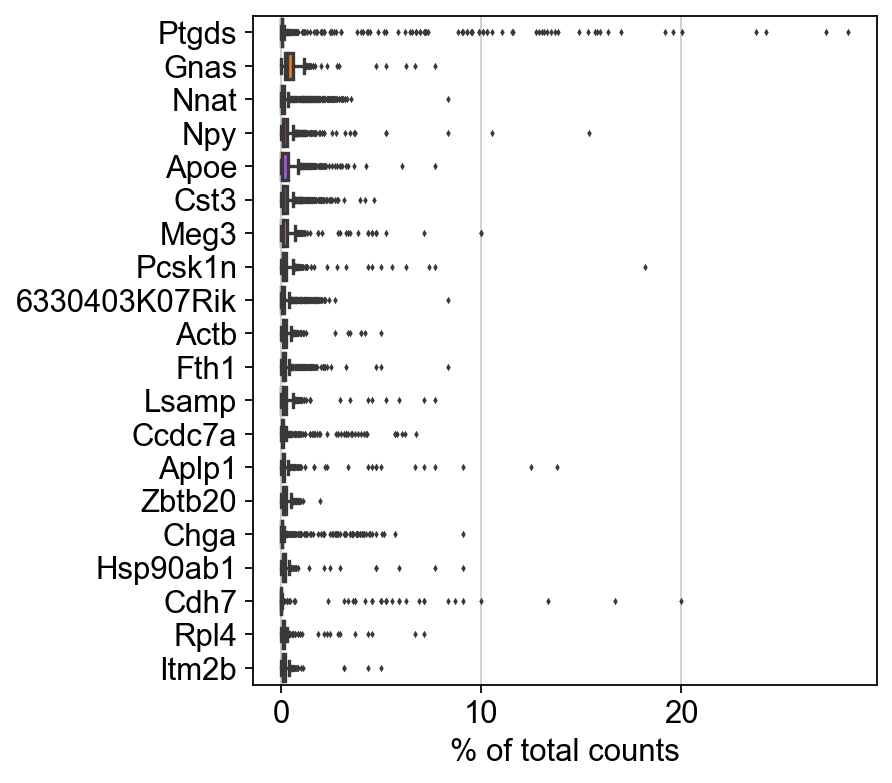

In [8]:
sc.pl.highest_expr_genes(adata_tomcells, n_top=20,save="highest_exp_genes_tomcells.pdf")

Basic filtering.

In [9]:
sc.pp.filter_cells(adata_tomcells, min_genes=2000) #skip this high, recalculates the # of genes
sc.pp.filter_genes(adata_tomcells, min_cells=2)

filtered out 386 cells that have less than 2000 genes expressed
filtered out 6471 genes that are detected in less than 2 cells


In [10]:
#some averages after the filtering...
print(np.median(adata_tomcells.obs['ERCC_genes']), 'median % are ERCC_genes before filtering')
print(np.median(adata_tomcells.obs['percent_mito']), "median mito_genes/total before filtering, without ERCC")
print(np.median(adata_tomcells.obs['n_counts_withERCCmito']), "median number of reads with ERCC per cell")
print(np.median(adata_tomcells.obs['n_counts_with_mito']), "median number of reads without ERCC per cell")
print(np.median(adata_tomcells.obs['n_counts']), "median number of reads per cell, without ERCC and mito")
print(np.median(adata_tomcells.obs['percent_ribo']), "median percent of ribosomal genes per cell")
print(np.median(adata_tomcells.obs['n_genes']), "median number of genes per cell, without ERCC and mito")
print(np.median(adata_tomcells.obs['percent_coding']), "median percent of protein_coding genes per cell")
print(np.median(adata_tomcells.obs['percent_lincRNA']), "median percent of lincRNA genes per cell")
print(np.median(adata_tomcells.obs['percent_antisense']), "median percent of antisense genes per cell")
print(np.median(adata_tomcells.obs['percent_miRNA']), "median percent of miRNA genes per cell")
print(np.median(adata_tomcells.obs['percent_bidirectional_promoter_lncRNA']), "median percent of bidirectional_promoter_lncRNA genes per cell")
print(np.median(adata_tomcells.obs['percent_snoRNA']), "median percent of snoRNA genes per cell")
print(np.median(adata_tomcells.obs['sum_miRNA']), "median or total miRNA genes per cell")
print(np.median(adata_tomcells.obs['sum_antisense']), "median or total miRNA genes per cell")
print(np.median(adata_tomcells.obs['sum_lincRNA']), "median or total miRNA genes per cell")


0.13744539 median % are ERCC_genes before filtering
0.06566152 median mito_genes/total before filtering, without ERCC
18896.918 median number of reads with ERCC per cell
15896.587 median number of reads without ERCC per cell
14783.219 median number of reads per cell, without ERCC and mito
0.01668303 median percent of ribosomal genes per cell
5447.0 median number of genes per cell, without ERCC and mito
0.95463324 median percent of protein_coding genes per cell
0.013926188 median percent of lincRNA genes per cell
0.0035487942 median percent of antisense genes per cell
0.0026987216 median percent of miRNA genes per cell
0.0006081246 median percent of bidirectional_promoter_lncRNA genes per cell
0.00012584832 median percent of snoRNA genes per cell
40.047234 median or total miRNA genes per cell
50.01002 median or total miRNA genes per cell
208.34251 median or total miRNA genes per cell


Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

In [11]:
sc.pp.calculate_qc_metrics(adata_tomcells, expr_type='counts', 
                           var_type='genes', qc_vars=(), percent_top=(50, 100, 200, 500), 
                           inplace=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts.

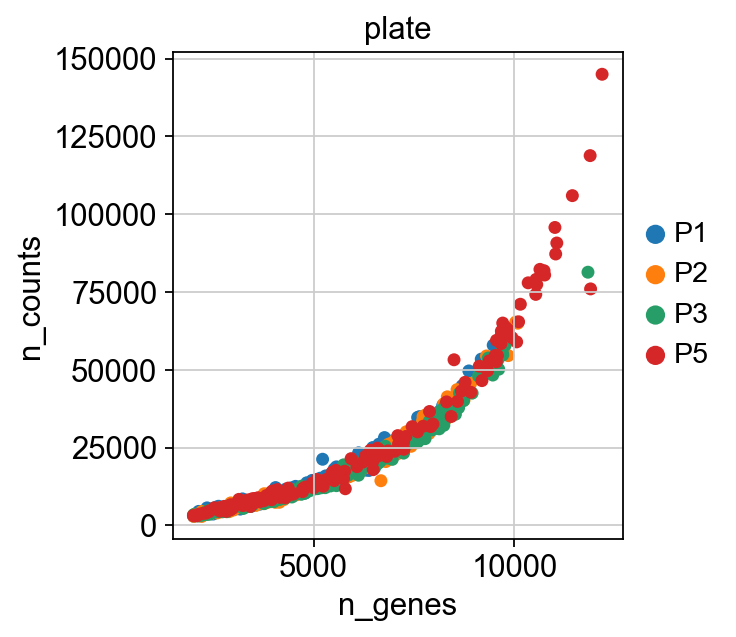

In [12]:
sc.pl.scatter(adata_tomcells, x='n_genes', y='n_counts',color = 'plate')

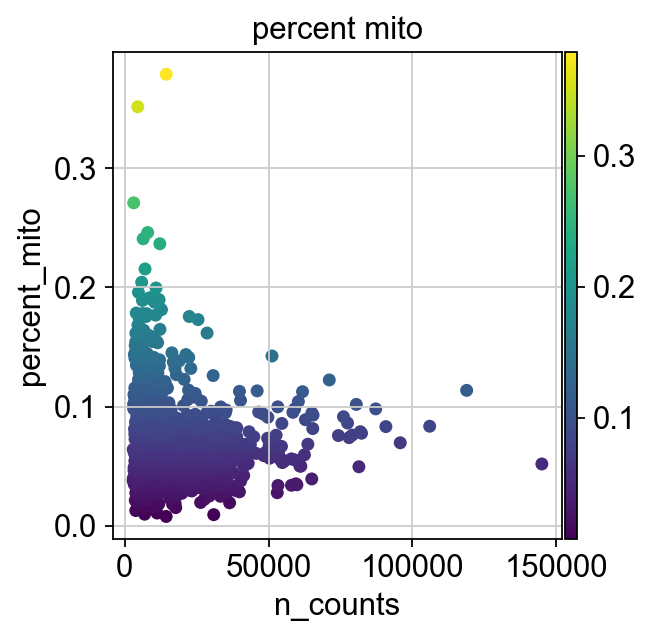

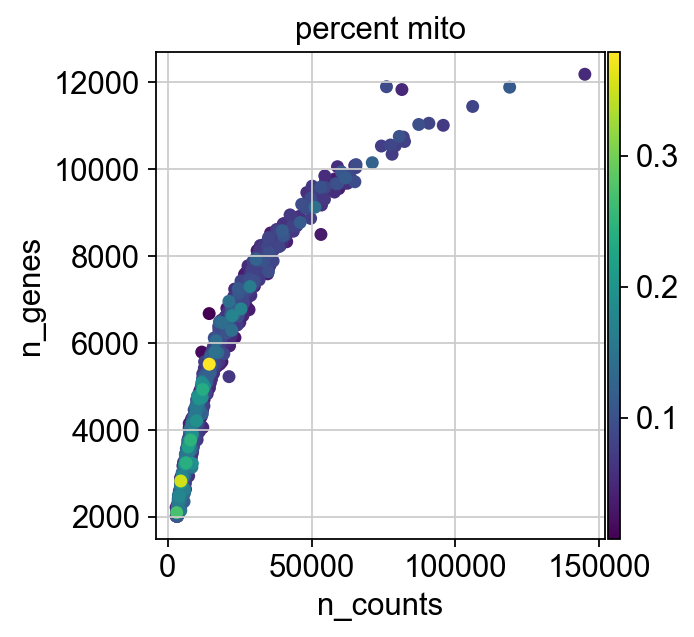

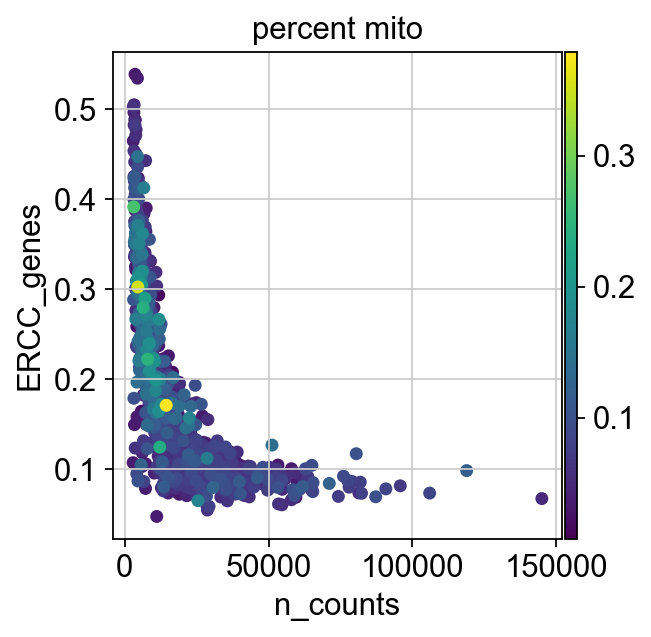

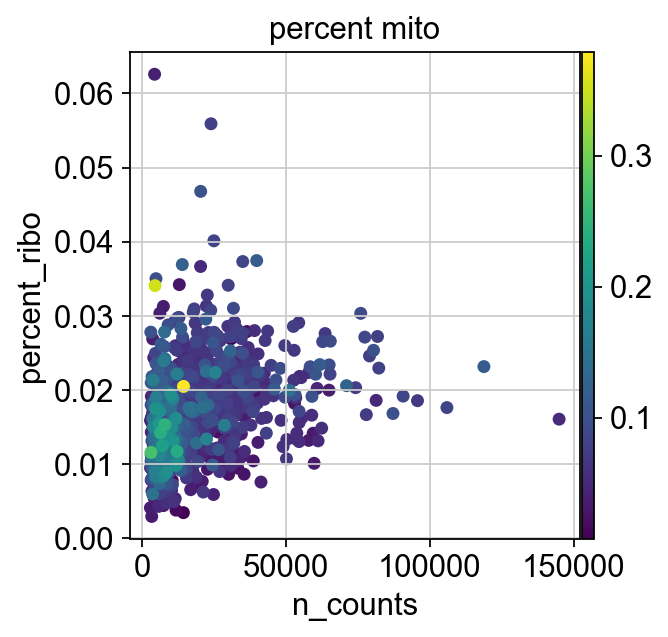

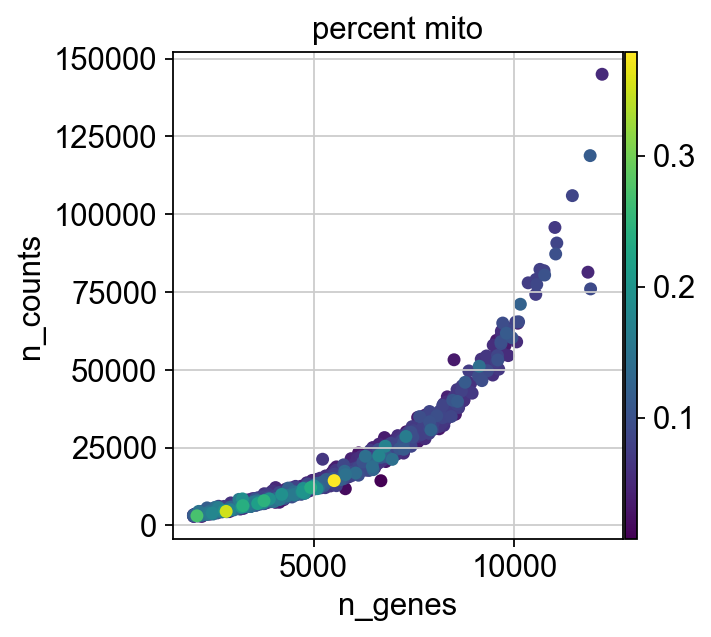

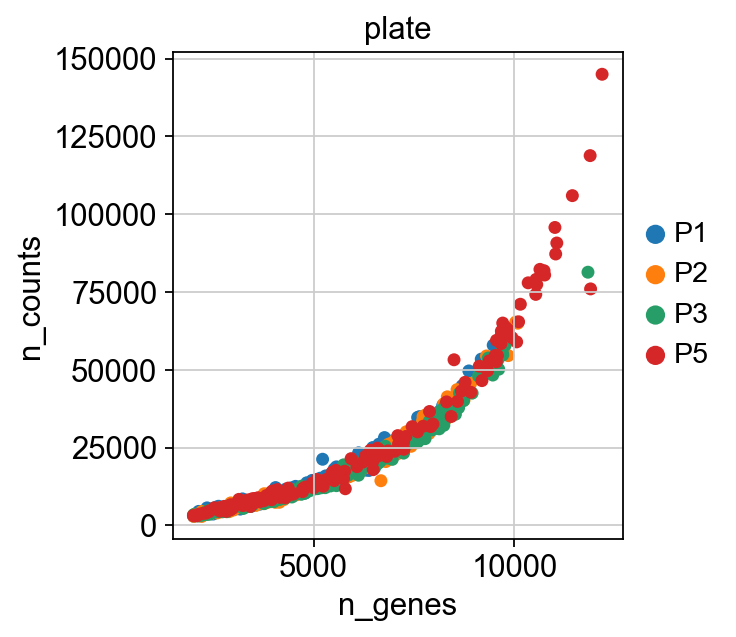

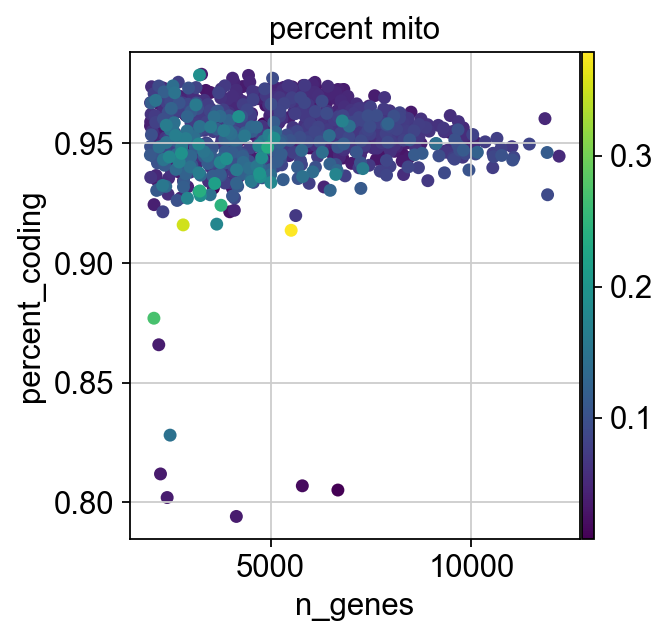

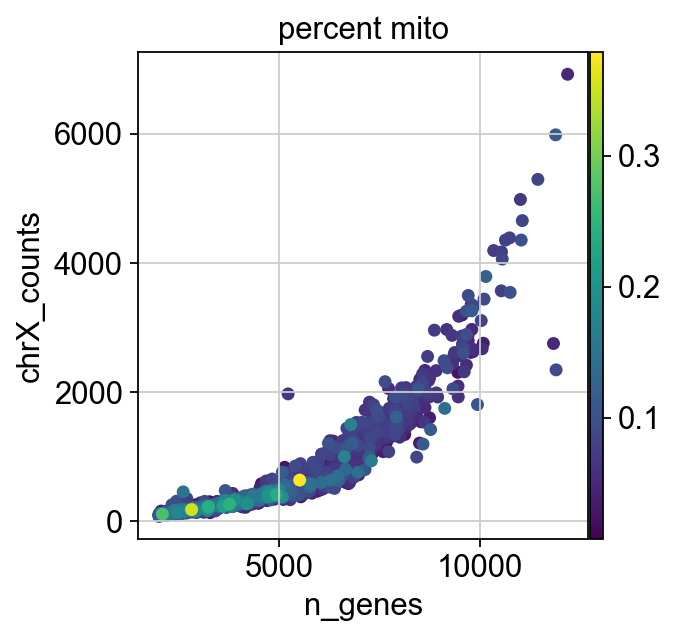

In [13]:
#look at the distribution of categories colored by mito %
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_mito',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_1.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='n_genes',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_2.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='ERCC_genes',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_3.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_ribo',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_4.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='n_counts',color = 'percent_mito', save= "tomcells_adjustedscatter_plot_filter_5.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='n_counts',color = 'plate', save= "tomcells_adjusted_scatter_plot_filter_6.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='percent_coding',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_7.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='chrX_counts',color = 'percent_mito', save= "tomcells_adjusted_scatter_plot_filter_8.png")


This introduces a bias! The complexity is changed. Need to downsample at the expense of losing genes

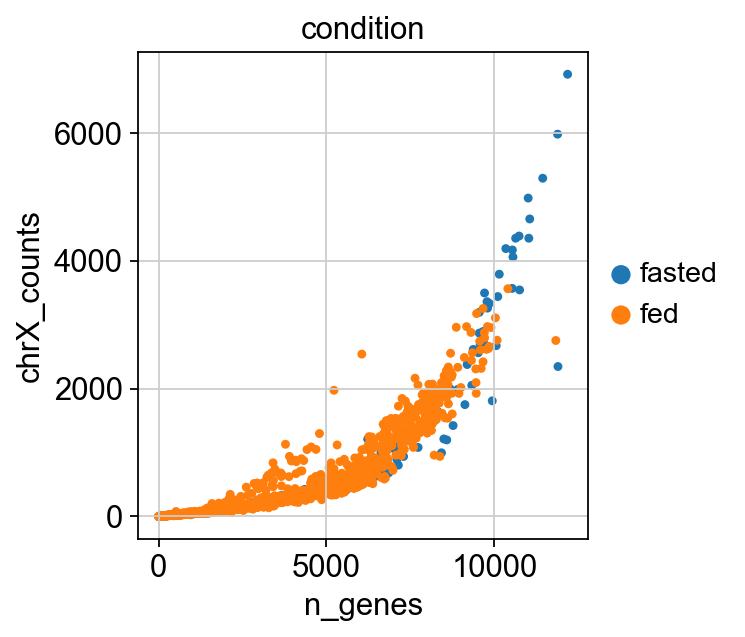

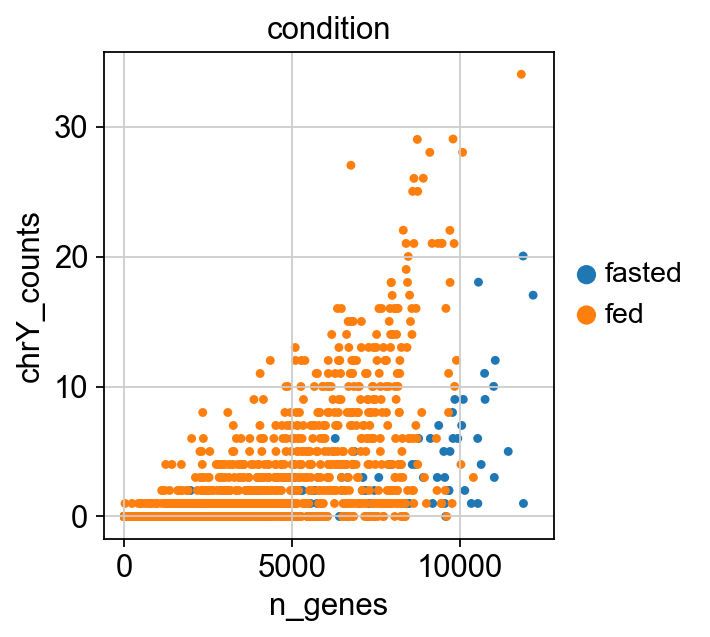

In [14]:
sc.pl.scatter(adata_allcells, x='n_genes', y='chrX_counts',color = 'condition', save= "allcells_scatter_plot_filter_chrX_counts.png")
sc.pl.scatter(adata_allcells, x='n_genes', y='chrY_counts',color = 'condition', save= "allcells_scatter_plot_filter_chrY_counts.png")


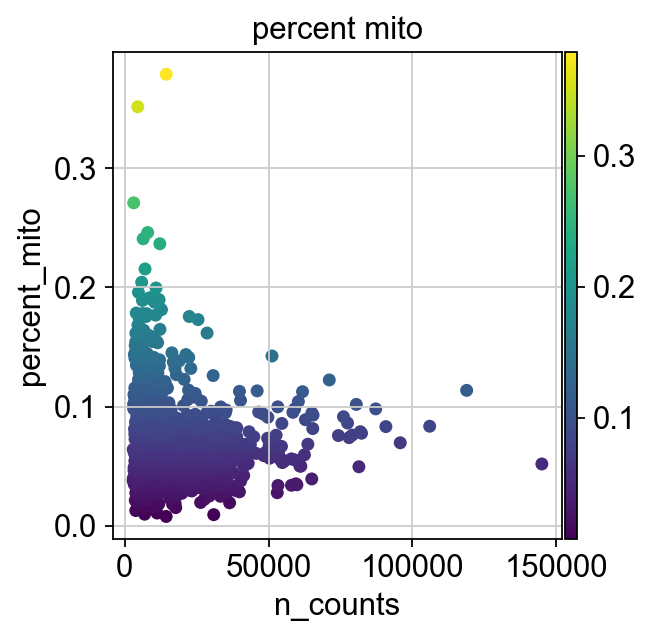

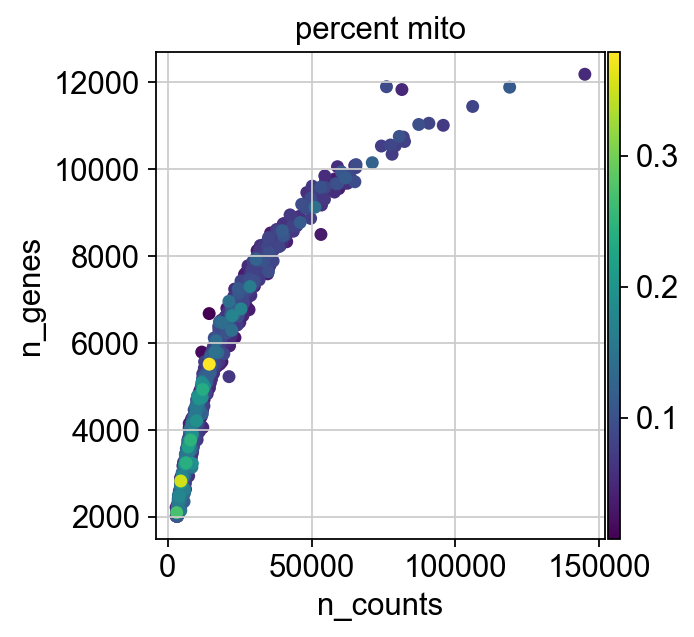

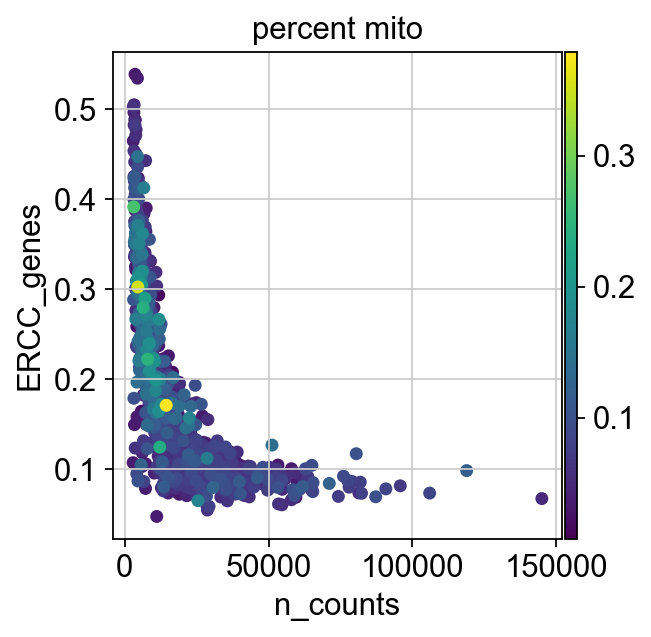

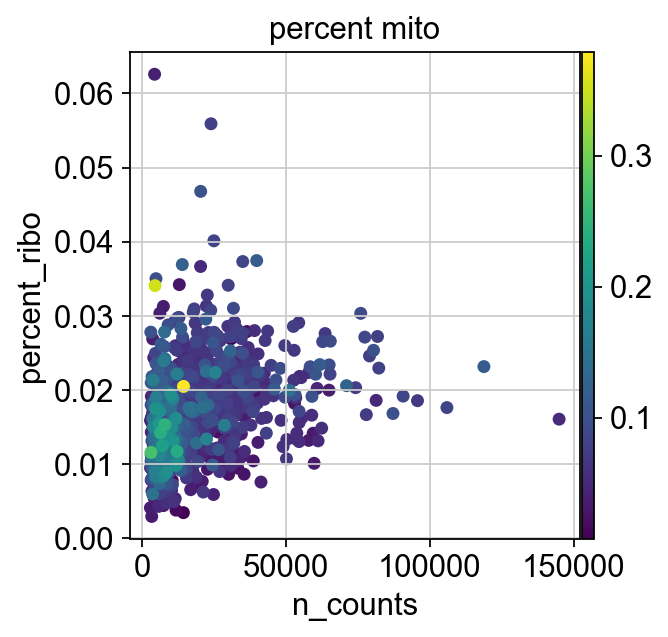

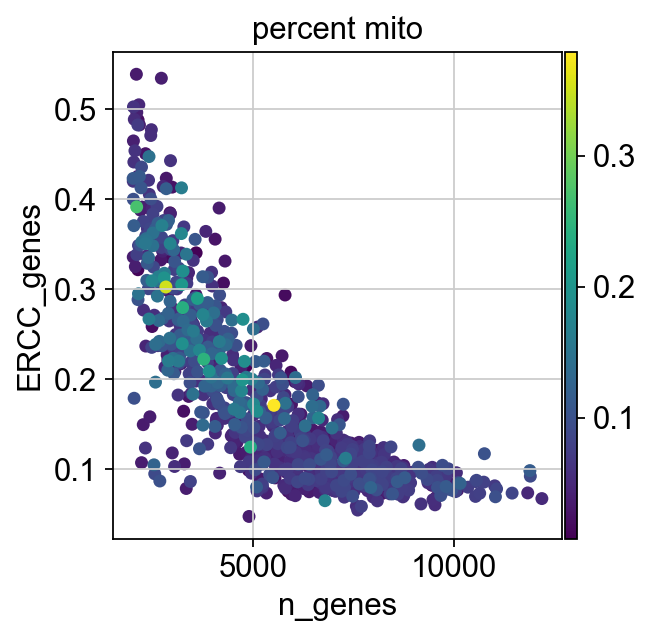

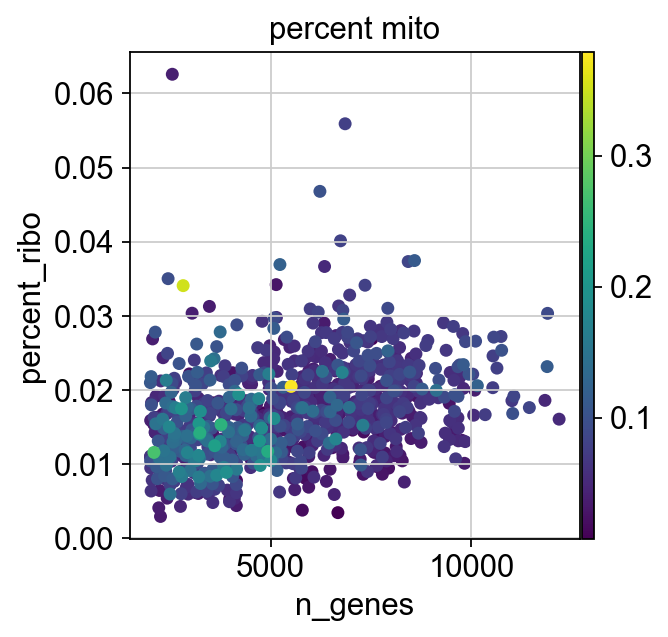

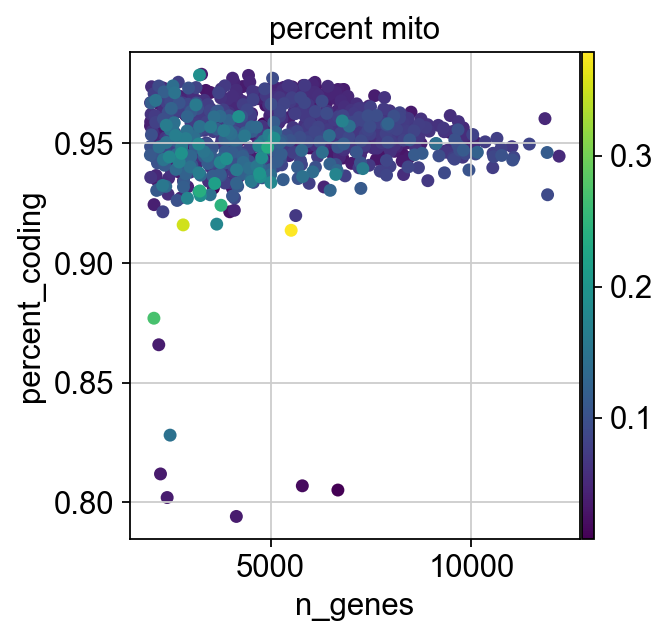

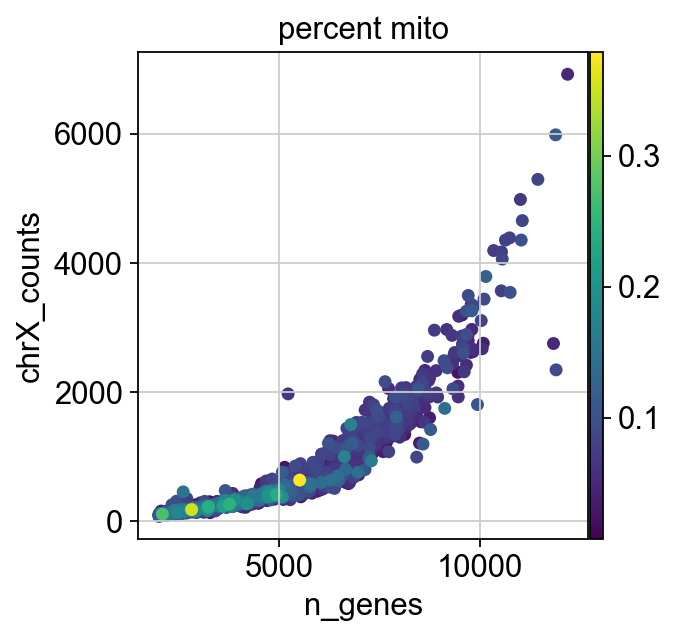

In [15]:
#look at the distribution of categories colored by mito %
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_mito',color = 'percent_mito', save= "tomcells_scatter_plot_filter_1.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='n_genes',color = 'percent_mito', save= "tomcells_scatter_plot_filter_2.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='ERCC_genes',color = 'percent_mito', save= "tomcells_scatter_plot_filter_3.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_ribo',color = 'percent_mito', save= "tomcells_scatter_plot_filter_4.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='ERCC_genes',color = 'percent_mito', save= "tomcells_scatter_plot_filter_5.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='percent_ribo',color = 'percent_mito', save= "tomcells_scatter_plot_filter_6.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='percent_coding',color = 'percent_mito', save= "tomcells_scatter_plot_filter_7.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='chrX_counts',color = 'percent_mito', save= "tomcells_scatter_plot_filter_8.png")


Actually do the filtering.

In [16]:
adata_allcells = adata_allcells[adata_allcells.obs['n_counts'] < 100000, :] # should remove one cell
#adata = adata[adata.obs['n_genes'] < 7000, :] #checked the quality of cells with high gene no, looks good
adata_allcells = adata_allcells[adata_allcells.obs['percent_mito'] < 0.15, :]
adata_allcells = adata_allcells[adata_allcells.obs['percent_ribo'] < 0.15, :]
adata_allcells = adata_allcells[adata_allcells.obs['ERCC_genes'] < 0.5, :]
adata_allcells = adata_allcells[adata_allcells.obs['percent_coding'] > 0.90, :]

In [17]:
adata_tomcells = adata_tomcells[adata_tomcells.obs['n_counts'] < 100000, :] # should remove one cell
#adata = adata[adata.obs['n_genes'] < 7000, :] #checked the quality of cells with high gene no, looks good
adata_tomcells = adata_tomcells[adata_tomcells.obs['percent_mito'] < 0.15, :]
adata_tomcells = adata_tomcells[adata_tomcells.obs['percent_ribo'] < 0.15, :]
adata_tomcells = adata_tomcells[adata_tomcells.obs['ERCC_genes'] < 0.5, :]
adata_tomcells = adata_tomcells[adata_tomcells.obs['percent_coding'] > 0.90, :]

Trying to set attribute `.uns` of view, copying.


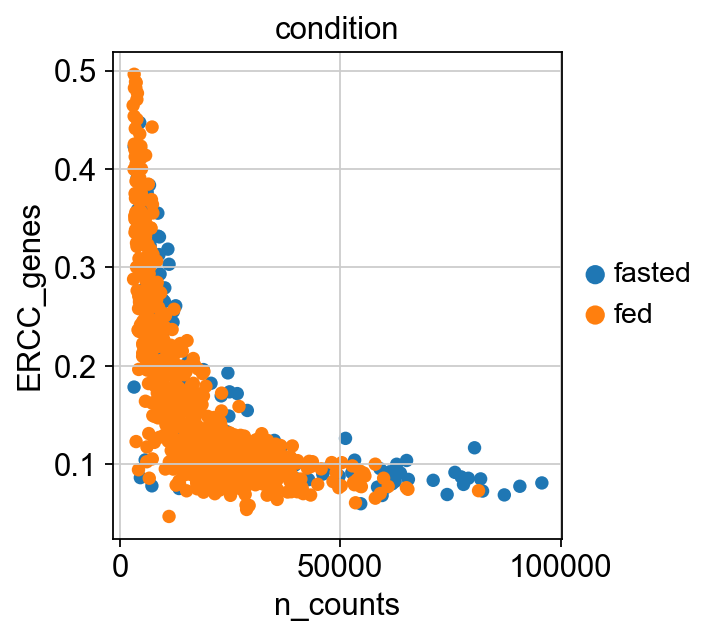

In [18]:
sc.pl.scatter(adata_tomcells, x='n_counts', y='ERCC_genes',color = 'condition', save= "_tomcells_condition_ERCC.png")
#sc.pl.scatter(adata_tomcells[adata_tomcells.obs['condition'] == 'fed'], x='n_counts', y='ERCC_genes',color = 'condition', save= "_tomcells_condition_fed_ERCC.png")
#sc.pl.scatter(adata_tomcells[adata_tomcells.obs['condition'] == 'fasted'], x='n_counts', y='ERCC_genes',color = 'condition', save= "_tomcells_condition_fasted_ERCC.png")


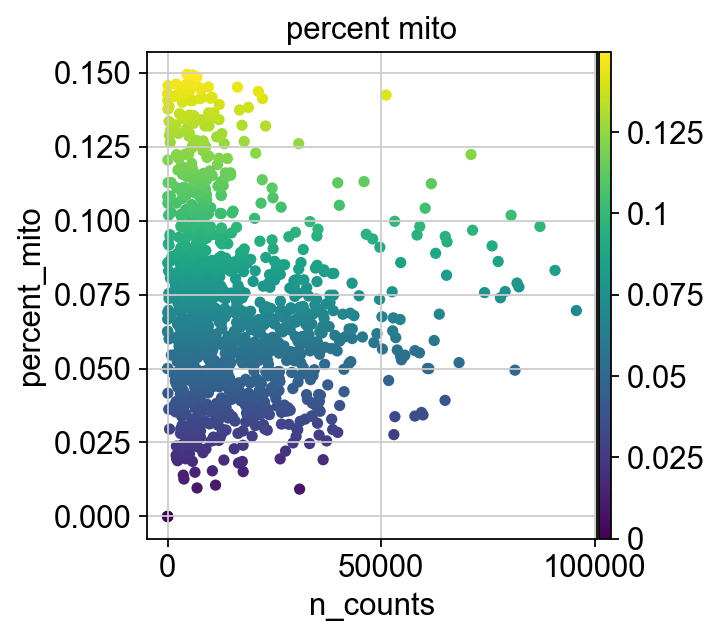

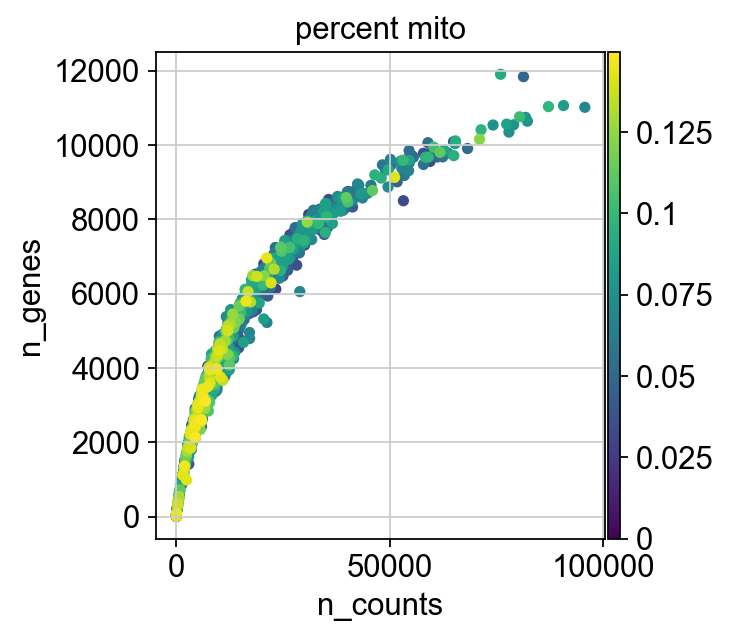

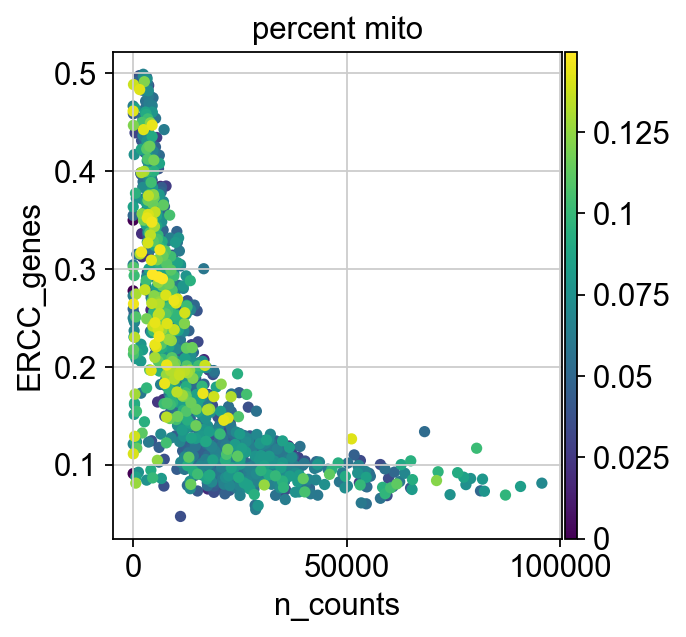

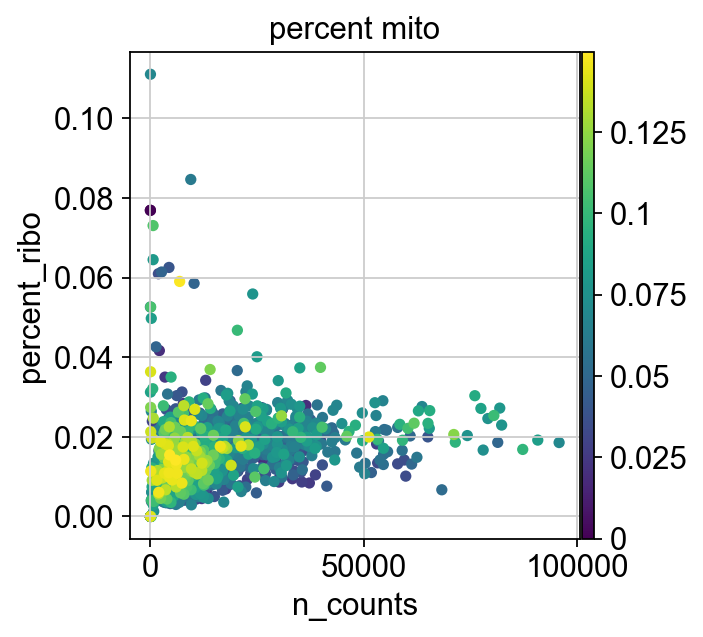

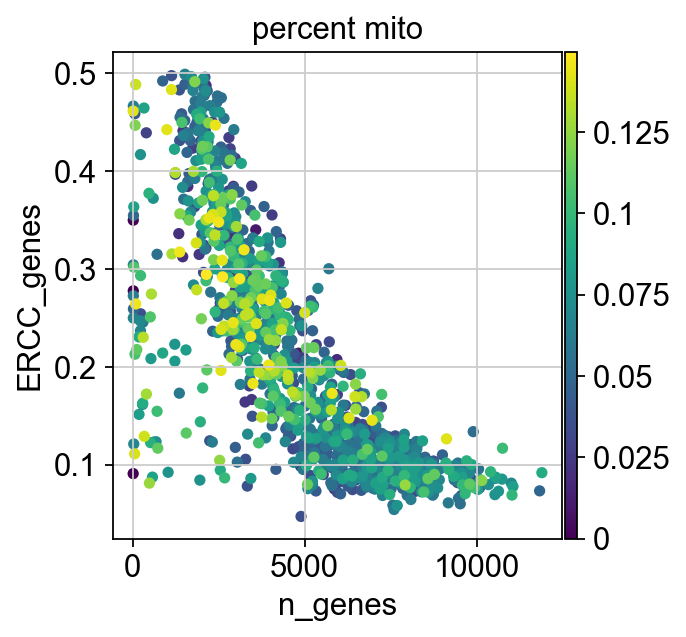

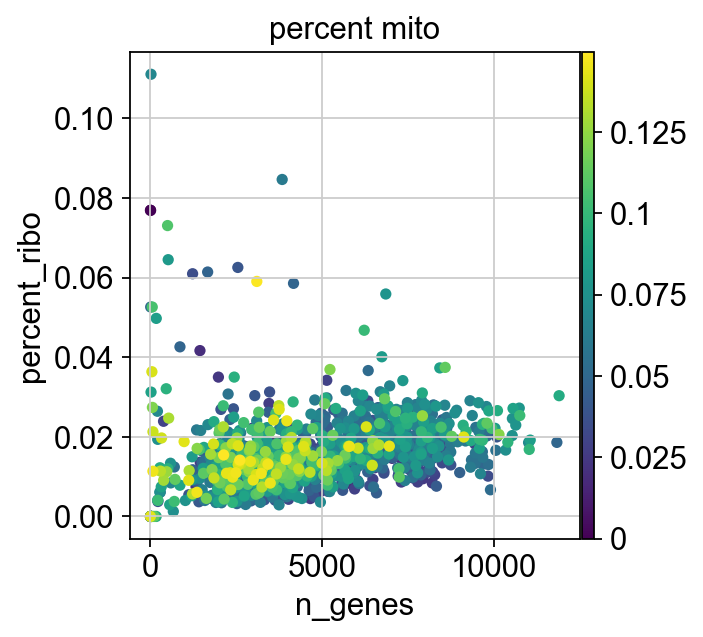

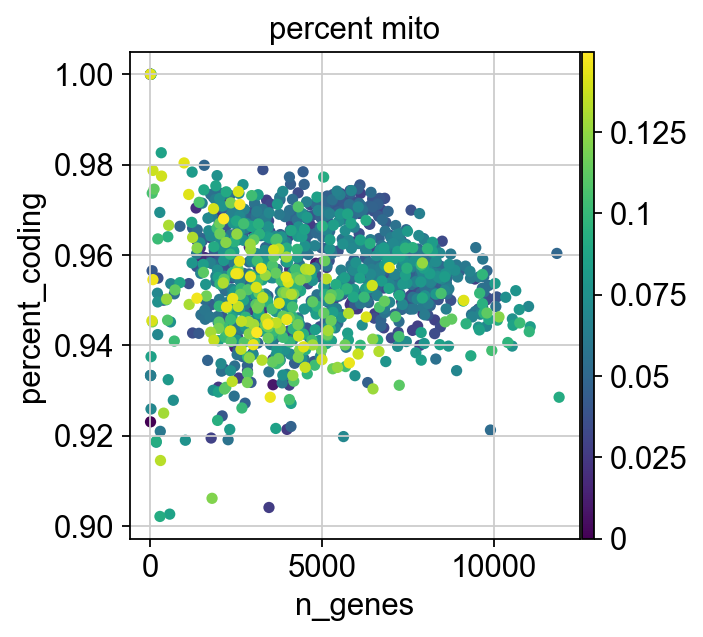

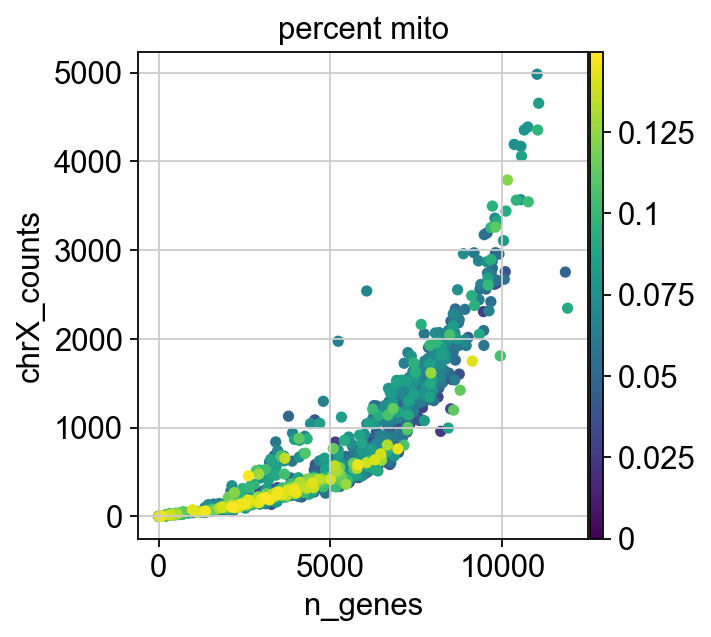

In [19]:
#look at the distribution of categories colored by mito %
sc.pl.scatter(adata_allcells, x='n_counts', y='percent_mito',color = 'percent_mito', save= "_allcells_secondfilter_1.png")
sc.pl.scatter(adata_allcells, x='n_counts', y='n_genes',color = 'percent_mito', save= "_allcells_secondfilter_2.png")
sc.pl.scatter(adata_allcells, x='n_counts', y='ERCC_genes',color = 'percent_mito', save= "_allcells_secondfilter_3.png")
sc.pl.scatter(adata_allcells, x='n_counts', y='percent_ribo',color = 'percent_mito', save= "=_allcells_secondfilter_4.png")
sc.pl.scatter(adata_allcells, x='n_genes', y='ERCC_genes',color = 'percent_mito', save= "_allcells_secondfilter_5.png")
sc.pl.scatter(adata_allcells, x='n_genes', y='percent_ribo',color = 'percent_mito', save= "_allcells_secondfilter_6.png")
sc.pl.scatter(adata_allcells, x='n_genes', y='percent_coding',color = 'percent_mito', save= "_allcells_secondfilter_7.png")
sc.pl.scatter(adata_allcells, x='n_genes', y='chrX_counts',color = 'percent_mito', save= "_allcells_scatter_plot_filter_8.png")


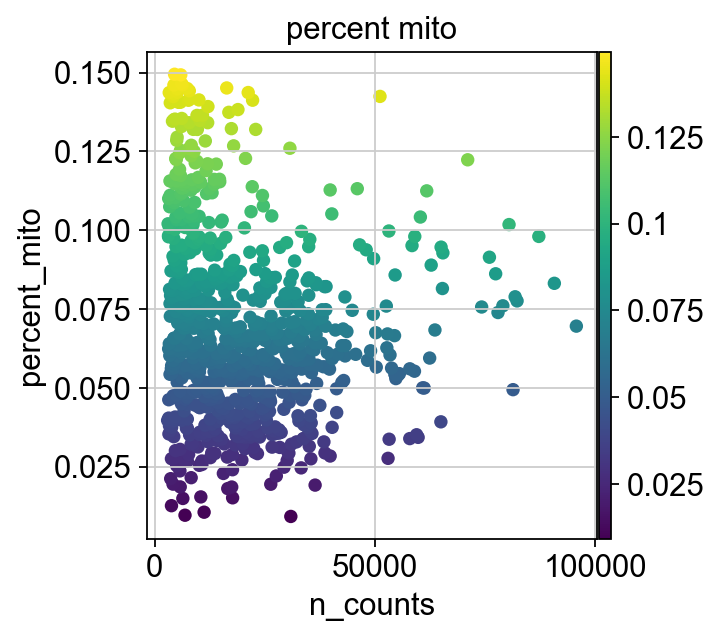

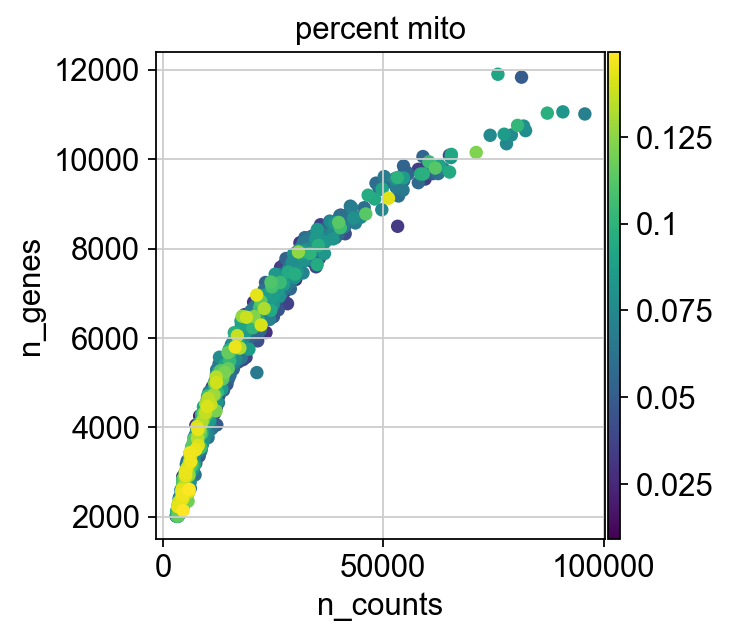

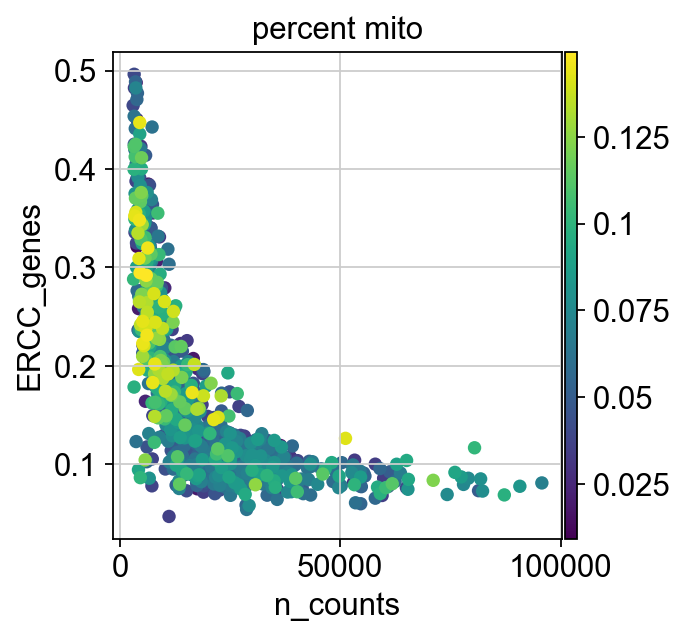

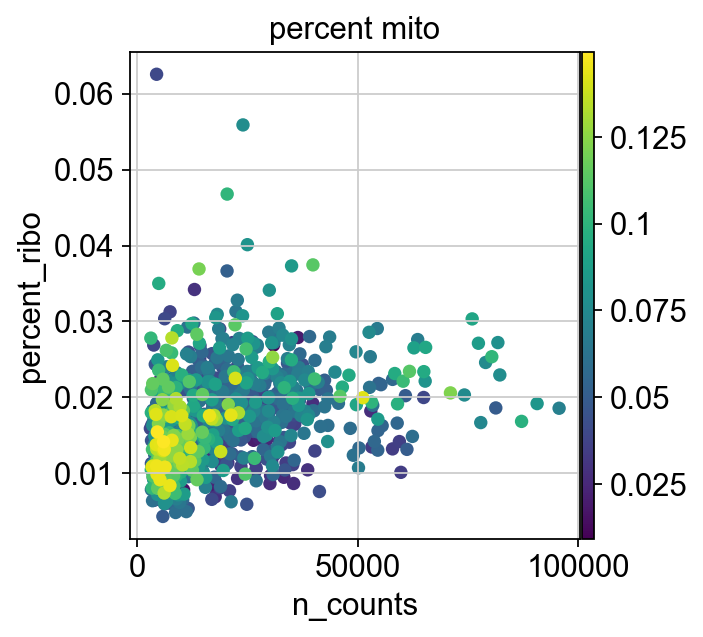

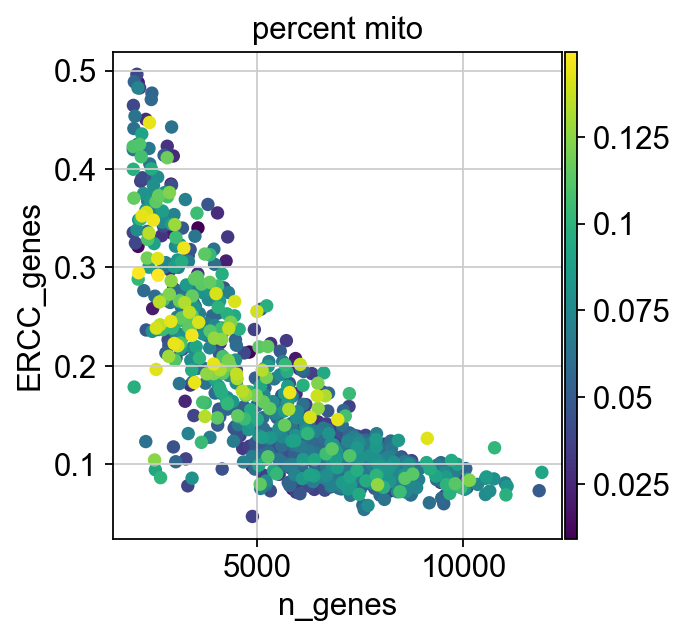

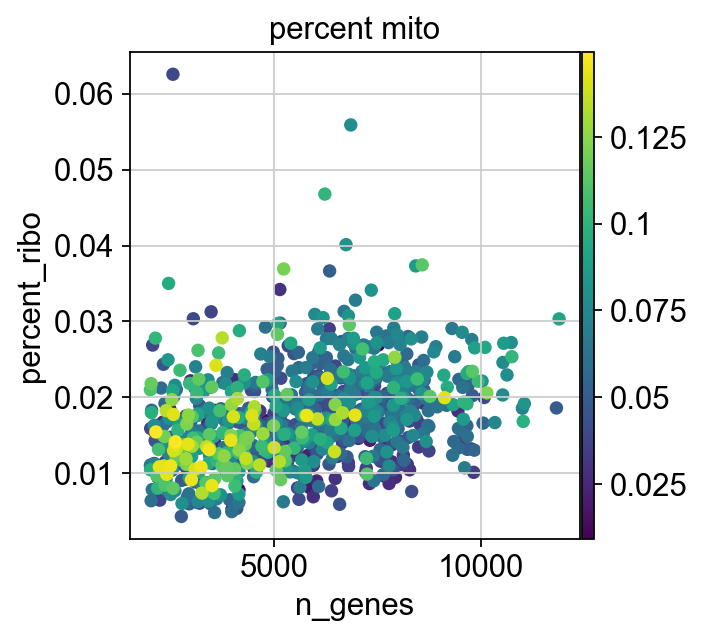

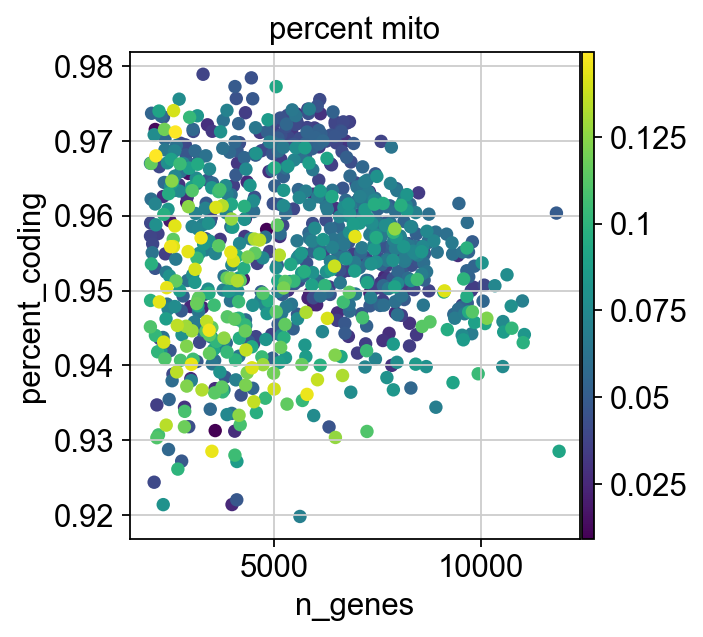

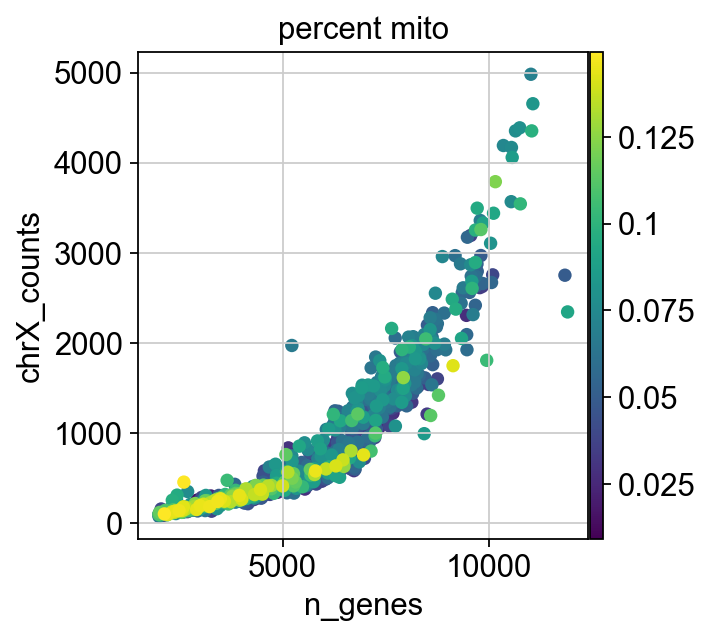

In [20]:
#look at the distribution of categories colored by mito %
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_mito',color = 'percent_mito', save= "_tomcells_secondfilter_1.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='n_genes',color = 'percent_mito', save= "_tomcells_secondfilter_2.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='ERCC_genes',color = 'percent_mito', save= "_tomcells_secondfilter_3.png")
sc.pl.scatter(adata_tomcells, x='n_counts', y='percent_ribo',color = 'percent_mito', save= "_tomcells_secondfilter_4.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='ERCC_genes',color = 'percent_mito', save= "_tomcells_secondfilter_5.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='percent_ribo',color = 'percent_mito', save= "_tomcells_secondfilter_6.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='percent_coding',color = 'percent_mito', save= "_tomcells_secondfilter_7.png")
sc.pl.scatter(adata_tomcells, x='n_genes', y='chrX_counts',color = 'percent_mito', save= "_tomcells_scatter_plot_filter_8.png")


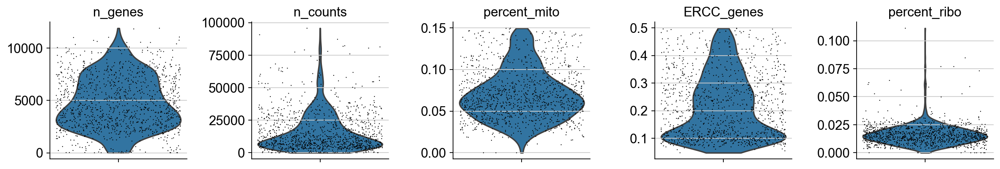

In [21]:
sc.pl.violin(adata_allcells, ['n_genes', 'n_counts', 'percent_mito','ERCC_genes','percent_ribo'],
             jitter=0.4, multi_panel=True,save="_adata_allcells_quality_measures_filter.pdf")

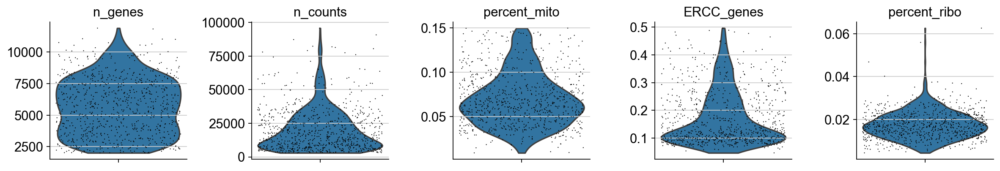

In [22]:
sc.pl.violin(adata_tomcells, ['n_genes', 'n_counts', 'percent_mito','ERCC_genes','percent_ribo'],
             jitter=0.4, multi_panel=True,save="_adata_tomcells_quality_measures_filter.pdf")

Let's check if hte percentage of ERCC spike-ins are different between conditions
This will give us an idea is the total amount of RNA obtained from a specific condition is higher

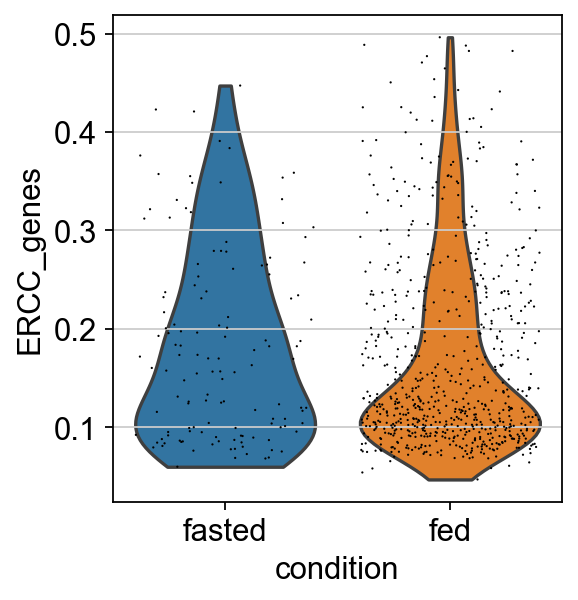

In [23]:
sc.pl.violin(adata_tomcells, ['ERCC_genes'],
             jitter=0.4, multi_panel=True,groupby ="condition") #,save="_adata_tomcells_quality_measures_filter.pdf"

In [24]:
print(np.mean(adata_tomcells.obs['ERCC_genes']), 'mean % are ERCC_genes after filtering')
print(np.mean(adata_tomcells[adata_tomcells.obs['condition'] == 'fed'].obs['ERCC_genes']), 'mean of fed % are ERCC_genes after filtering')
print(np.mean(adata_tomcells[adata_tomcells.obs['condition'] == 'fasted'].obs['ERCC_genes']), 'mean of fasted % are ERCC_genes after filtering')
print(np.mean(adata_tomcells.obs['n_counts']), "mean number of reads per cell, without ERCC and mito")
print(np.mean(adata_tomcells[adata_tomcells.obs['condition'] == 'fed'].obs['n_counts']), "is, among fed, the mean number of reads per cell, without ERCC and mito")
print(np.mean(adata_tomcells[adata_tomcells.obs['condition'] == 'fasted'].obs['n_counts']), 'is, among fasted, the mean number of reads per cell, without ERCC and mito')


0.17161623 mean % are ERCC_genes after filtering
0.16936609 mean of fed % are ERCC_genes after filtering
0.18341246 mean of fasted % are ERCC_genes after filtering
20042.732 mean number of reads per cell, without ERCC and mito
18647.127 is, among fed, the mean number of reads per cell, without ERCC and mito
27359.09 is, among fasted, the mean number of reads per cell, without ERCC and mito


#### Save the files for use in pyscenic pipeline

In [27]:
# First, save the rawdata, non logaritmized, for use in pyscenic
adata_allcells.raw = adata_allcells
adata_tomcells.raw = adata_tomcells

In [28]:
adata_allcells.write('../rawdata/Lepr_hypothalamus_allcells_prenorm.h5ad', compression='gzip')
adata_tomcells.write('../rawdata/Lepr_hypothalamus_tomcells_prenorm.h5ad', compression='gzip')

### Normalise and Downsample

First, try to downsample without normalisation and see the difference

In [25]:
adata_tomcells_down_nonnorm = adata_tomcells.copy()
sc.pp.downsample_counts(adata_tomcells_down_nonnorm, counts_per_cell= 3000)
adata_tomcells_down_nonnorm

AnnData object with n_obs × n_vars = 824 × 29547 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'plate_colors', 'condition_colors'

In [26]:
adata_allcells_down_nonnorm = adata_allcells.copy()
sc.pp.downsample_counts(adata_allcells_down_nonnorm, counts_per_cell= 3000)
adata_allcells_down_nonnorm

AnnData object with n_obs × n_vars = 1166 × 36018 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr'
    uns: 'condition_colors'

Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

In [27]:
sc.pp.normalize_total(adata_allcells, target_sum=1e4, key_added = "normalisation_factor",
                      exclude_highly_expressed=True)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['Wdr77', 'Pfdn5', 'Apoe', 'Pld3', 'Cdip1', 'Wdr1', 'Mef2c', 'Eif4g2', 'Aamp', 'Itih3', 'Aplp1', 'Rhoa', 'Rala', 'Cdk9', 'Evi5l', 'Ptgds', 'Lta4h', 'Ksr1', 'Ubb', 'Zwint', 'Tlk2', 'Sel1l', 'Vti1b', 'Chga', 'Wars', 'Cap2', 'Depdc1b', 'Cwc27', 'Cab39l', 'Esd', 'Tsc22d1', 'Cln5', 'Rad21', 'Apod', 'Scrib', 'Ly6c2', 'Cyp1b1', 'Nrxn1', 'Hagh', 'Apom', 'Ltb', 'Ik', 'Prrc1', 'Fth1', 'Zfp91', 'Tcf7l2', 'P4hb', 'Cenpx', 'Parp6', 'Itgb8', 'Caly', 'Fbxl16', 'Plekhb2', 'Ptprn', 'Ccdc93', 'Capn2', 'Iars2', 'Ralgds', 'Ntmt1', 'Sec16a', 'Api5', 'Patl2', 'Pcna', 'Chgb', 'Pkia', 'Gnas', 'Stmn3', 'Ndrg3', 'Rps20', 'Mpdz', 'Mllt3', 'Rnf220', 'Hp1bp3', 'Acot7', 'Tmem106b', 'Tmem176b', 'Npy', 'Mtpn', 'Anxa4', 'Cd27', 'Cd37', 'Pak3', 'Plp1', 'Leprotl1', 'Sorbs2', 'Cox4i1', 'Maml2', 'Pkm', 'Tmem30a', 'Cck', 'Kank1', 'Resp18', 'Adgrb3', 'Chmp2a', 'Dynlrb2', 'Zcchc11', 'Mrpl34', 'Ccl5', '

Trying to set attribute `.obs` of view, copying.


    finished (0:00:00)


In [28]:
sc.pp.normalize_total(adata_tomcells, target_sum=1e4, key_added = "normalisation_factor", 
                      exclude_highly_expressed=True)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['Ptgds', 'Chga', 'Apod', 'Plp1', 'Hbb-bs', 'Hba-a2', 'Hba-a1']
    finished (0:00:00)


In [29]:
adata_tomcells_down = adata_tomcells.copy()
sc.pp.downsample_counts(adata_tomcells_down, counts_per_cell= 3000)
adata_tomcells_down

AnnData object with n_obs × n_vars = 824 × 29547 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'normalisation_factor'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'plate_colors', 'condition_colors'

In [30]:
adata_tomcells_down.obs['n_counts_down'] = adata_tomcells_down.X.sum(axis=1)

In [31]:
adata_tomcells_down_nonnorm.obs['n_counts_down'] = adata_tomcells_down_nonnorm.X.sum(axis=1)

In [32]:
print(adata_tomcells_down.obs['n_counts'].min())
print(adata_tomcells_down_nonnorm.obs['n_counts'].min())

2954.4946
2954.4946


In [33]:
print(adata_tomcells_down.obs['n_counts_down'].min())
print(adata_tomcells_down_nonnorm.obs['n_counts_down'].min())

3000.0
2945.4858


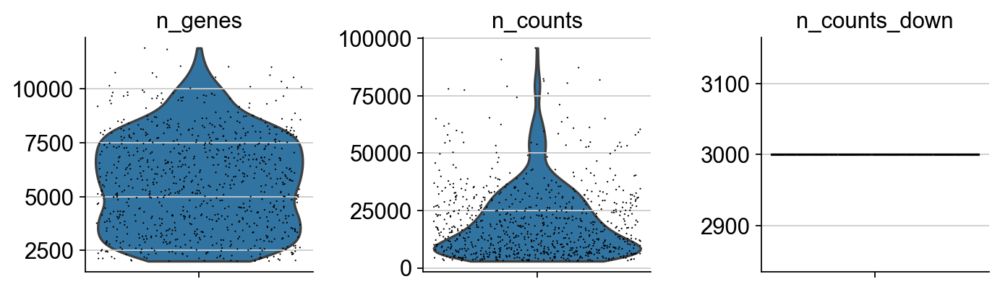

In [34]:
sc.pl.violin(adata_tomcells_down, ['n_genes', 'n_counts', 'n_counts_down'],
             jitter=0.4, multi_panel=True,save="tomcells_down_quality_measures_filter_allcells.pdf")

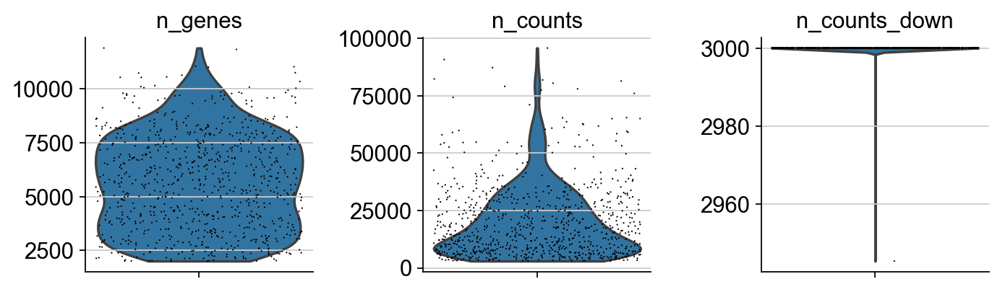

In [35]:
sc.pl.violin(adata_tomcells_down_nonnorm, ['n_genes', 'n_counts', 'n_counts_down'],
             jitter=0.4, multi_panel=True,save="tomcells_down_nonnorm_quality_measures_filter_allcells.pdf")

There are slight differences whether I normalise the reads before downsampling or not... Check why this is, but for now continue with normalised and downsampled samples

In [36]:
adata_allcells_down = adata_allcells.copy()
sc.pp.downsample_counts(adata_allcells_down, counts_per_cell= 3000)
adata_allcells_down

AnnData object with n_obs × n_vars = 1166 × 36018 
    obs: 'ERCC_genes', 'n_counts_withERCCmito', 'n_genes', 'n_counts_with_mito', 'percent_mito', 'n_counts', 'percent_ribo', 'percent_coding', 'percent_lincRNA', 'sum_lincRNA', 'percent_antisense', 'sum_antisense', 'percent_miRNA', 'sum_miRNA', 'percent_bidirectional_promoter_lncRNA', 'sum_bidirectional_promoter_lncRNA', 'percent_snoRNA', 'type', 'plate', 'condition', 'chrY_counts', 'chrX_counts', 'normalisation_factor'
    var: 'fullname', 'ENS_names', 'geneid', 'feature', 'chr'
    uns: 'condition_colors'

In [37]:
adata_allcells_down.obs['n_counts_down'] = adata_allcells_down.X.sum(axis=1)

In [38]:
adata_allcells_down_nonnorm.obs['n_counts_down'] = adata_allcells_down_nonnorm.X.sum(axis=1)

#### Save the downsampled files for the pyscenic analysis

In [25]:
# First, save the rawdata, non logaritmized, for use in pyscenic
adata_allcells_down_nonnorm.raw = adata_allcells_down_nonnorm
adata_tomcells_down_nonnorm.raw = adata_tomcells_down_nonnorm

In [26]:
adata_allcells_down_nonnorm.write('../rawdata/Lepr_hypothalamus_allcells_down_prenorm.h5ad', compression='gzip')
adata_tomcells_down_nonnorm.write('../rawdata/Lepr_hypothalamus_tomcells_down_prenorm.h5ad', compression='gzip')

Logarithmize the data.

In [39]:
sc.pp.log1p(adata_allcells)
sc.pp.log1p(adata_tomcells)
sc.pp.log1p(adata_allcells_down)
sc.pp.log1p(adata_tomcells_down)
sc.pp.log1p(adata_allcells_down_nonnorm)
sc.pp.log1p(adata_tomcells_down_nonnorm)

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the "relevant data" for visualization and differential testing, some would prefer to store the unnormalized data.

In [40]:
adata_allcells.raw = adata_allcells
adata_tomcells.raw = adata_tomcells
adata_allcells_down.raw = adata_allcells_down
adata_tomcells_down.raw = adata_tomcells_down
adata_allcells_down_nonnorm.raw = adata_allcells_down_nonnorm
adata_tomcells_down_nonnorm.raw = adata_tomcells_down_nonnorm

save the "non_norm file"s and do not continue with them from hereon

In [43]:
adata_allcells_down_nonnorm.write('../rawdata/Lepr_hypothalamus_allcells_nonnorm_down_preprocess.h5ad', compression='gzip')
adata_tomcells_down_nonnorm.write('../rawdata/Lepr_hypothalamus_tomcells_nonnorm_down_preprocess.h5ad', compression='gzip')

### Identify highly-variable genes.

In [41]:
sc.pp.highly_variable_genes(adata_allcells, min_mean=0.05, max_mean=3, min_disp=0.5, flavor = 'seurat')#,batch_key = 'plate'
sc.pp.highly_variable_genes(adata_tomcells, min_mean=0.05, max_mean=3, min_disp=0.5, flavor = 'seurat')#,batch_key = 'plate'
sc.pp.highly_variable_genes(adata_allcells_down, min_mean=0.05, max_mean=3, min_disp=0.5, flavor = 'seurat')#,batch_key = 'plate'
sc.pp.highly_variable_genes(adata_tomcells_down, min_mean=0.05, max_mean=3, min_disp=0.5, flavor = 'seurat')#,batch_key = 'plate'


extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


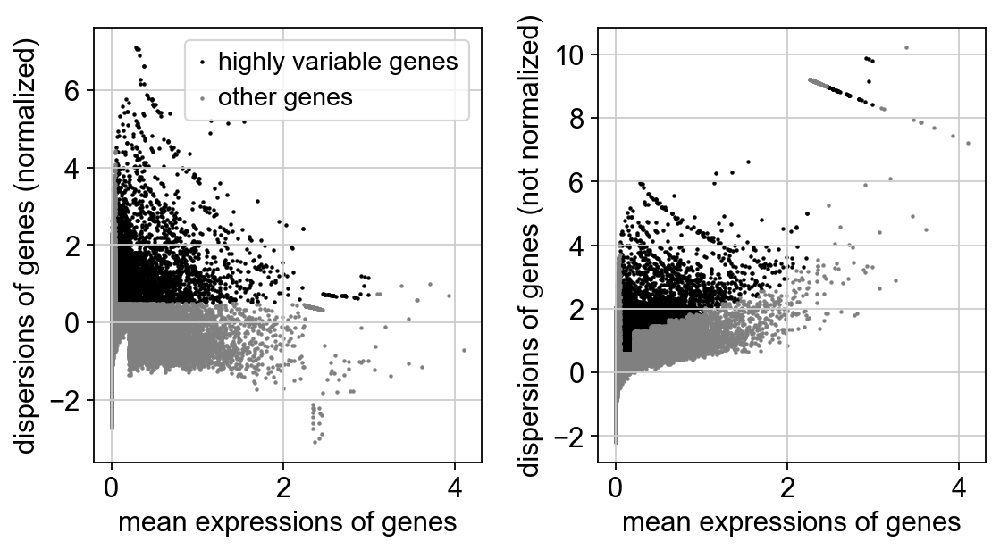

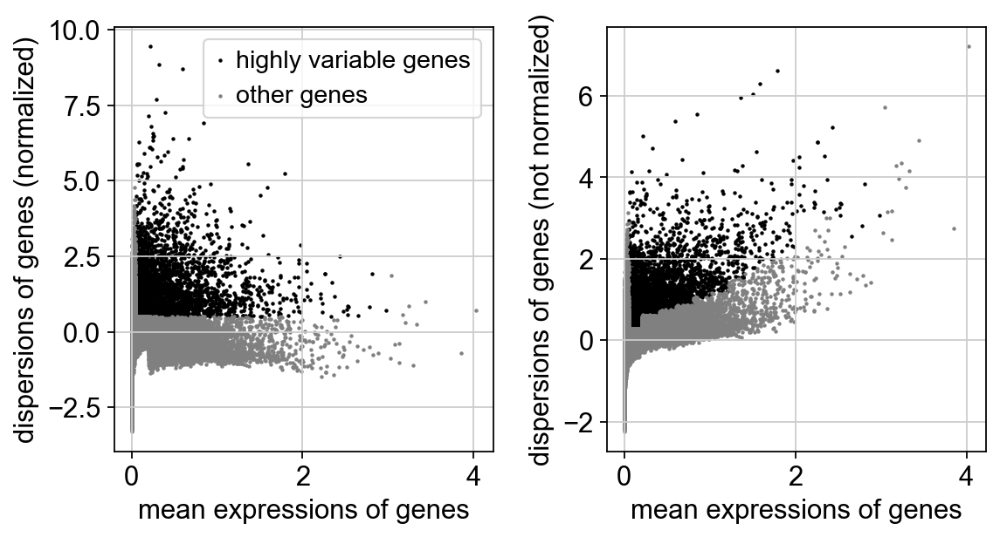

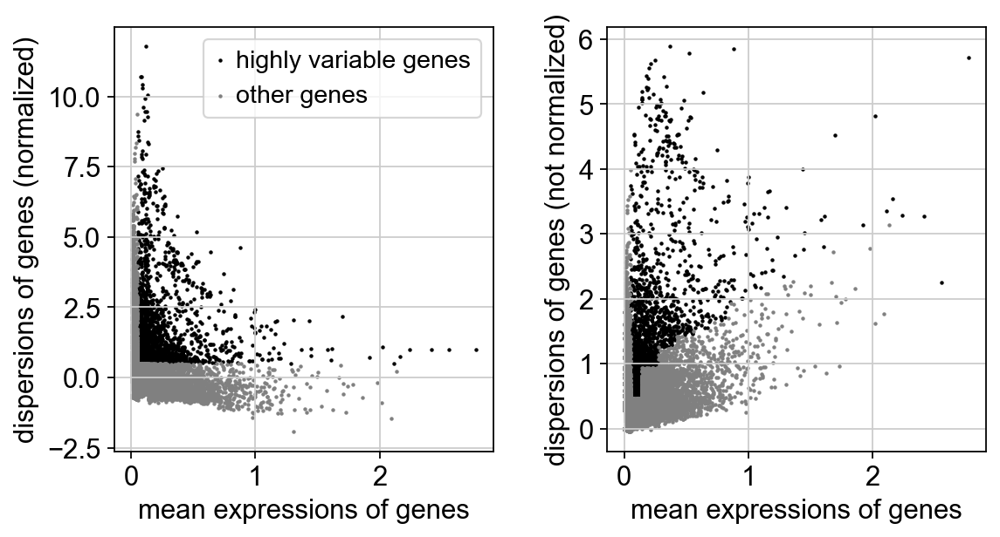

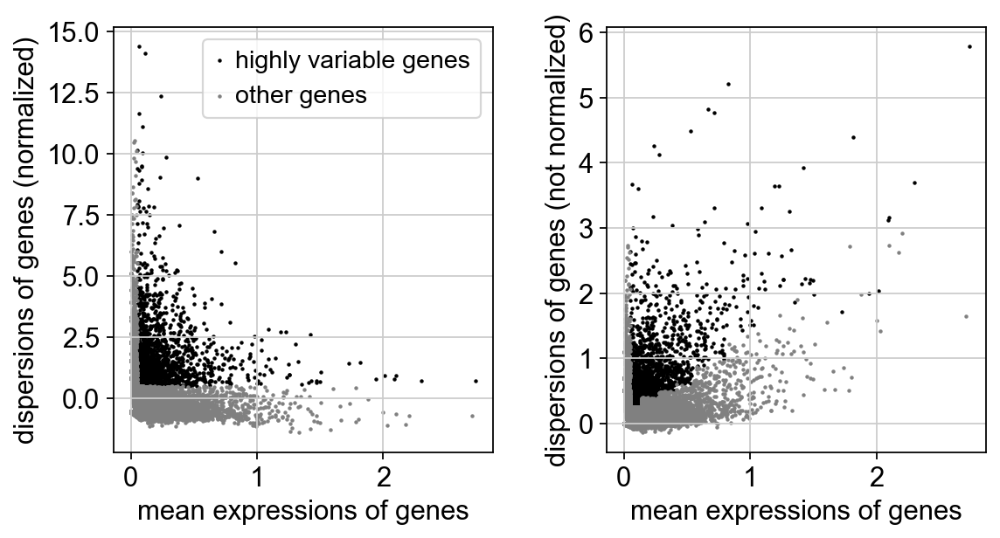

In [42]:
sc.pl.highly_variable_genes(adata_allcells)
sc.pl.highly_variable_genes(adata_tomcells)
sc.pl.highly_variable_genes(adata_allcells_down)
sc.pl.highly_variable_genes(adata_tomcells_down)

###### Filter

In [43]:
adata_allcells = adata_allcells[:, adata_allcells.var['highly_variable']]
adata_tomcells = adata_tomcells[:, adata_tomcells.var['highly_variable']]
adata_allcells_down = adata_allcells_down[:, adata_allcells_down.var['highly_variable']]
adata_tomcells_down = adata_tomcells_down[:, adata_tomcells_down.var['highly_variable']]

### Note: Exclude X and Ychromosome genes

In [44]:
adata_allcells = adata_allcells[:,adata_allcells.var['chr'] != "X"]
adata_allcells = adata_allcells[:,adata_allcells.var['chr'] != "Y"] 
adata_tomcells = adata_tomcells[:,adata_tomcells.var['chr'] != "X"]
adata_tomcells = adata_tomcells[:,adata_tomcells.var['chr'] != "Y"] 
adata_allcells_down = adata_allcells_down[:,adata_allcells_down.var['chr'] != "X"]
adata_allcells_down = adata_allcells_down[:,adata_allcells_down.var['chr'] != "Y"] 
adata_tomcells_down = adata_tomcells_down[:,adata_tomcells_down.var['chr'] != "X"]
adata_tomcells_down = adata_tomcells_down[:,adata_tomcells_down.var['chr'] != "Y"] 

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [45]:
sc.pp.regress_out(adata_allcells, ['n_counts']) #percent_mito, since mito genes are removed, dont use this
sc.pp.regress_out(adata_tomcells, ['n_counts']) #percent_mito, since mito genes are removed, dont use this
#sc.pp.regress_out(adata_allcells_down, ['percent_mito']) #do not regress out the nCounts since it is downsampled
#sc.pp.regress_out(adata_tomcells_down, ['percent_mito']) #do not regress out the nCounts since it is downsampled

regressing out ['n_counts']
    finished (0:00:18)
regressing out ['n_counts']
    finished (0:00:13)


Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [46]:
sc.pp.scale(adata_allcells, max_value=10)
sc.pp.scale(adata_tomcells, max_value=10)
sc.pp.scale(adata_allcells_down, max_value=10)
sc.pp.scale(adata_tomcells_down, max_value=10)

/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:912: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [47]:
sc.tl.pca(adata_allcells, svd_solver='arpack')
sc.tl.pca(adata_tomcells, svd_solver='arpack')
sc.tl.pca(adata_allcells_down, svd_solver='arpack')
sc.tl.pca(adata_tomcells_down, svd_solver='arpack')

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:01)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:00)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:00)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:00)


We can make a scatter plot in the PCA coordinates

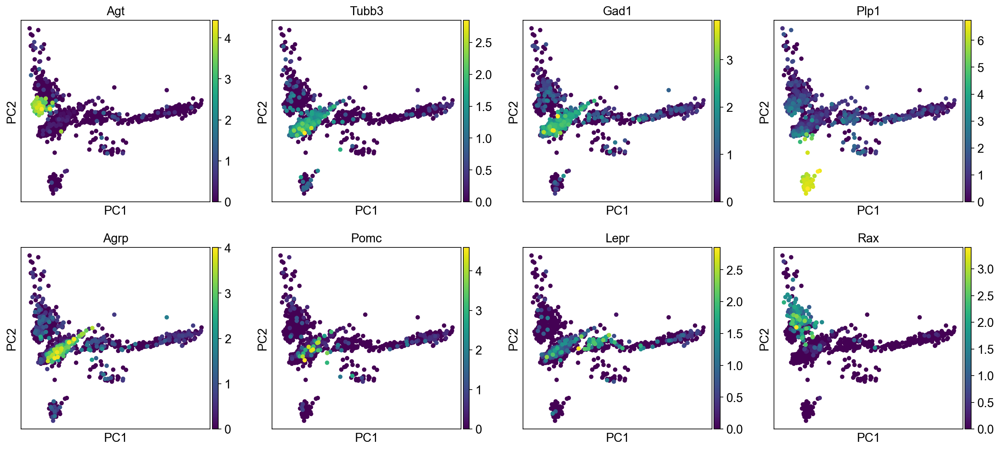

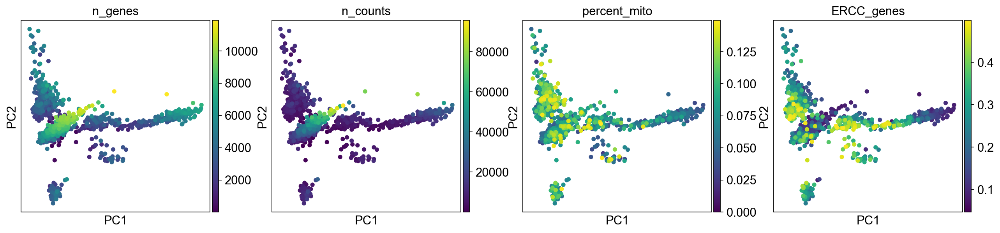

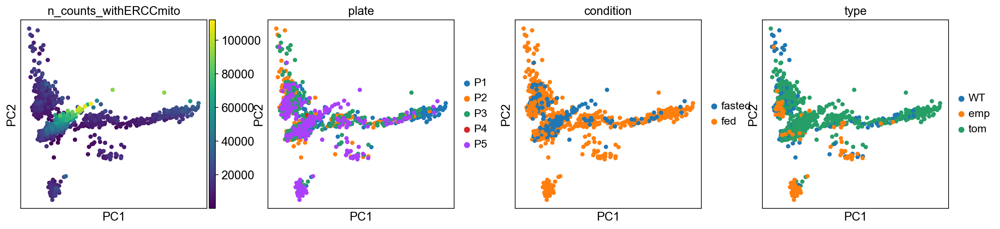

In [48]:
sc.pl.pca(adata_allcells, color=['Agt','Tubb3','Gad1','Plp1','Agrp','Pomc','Lepr','Rax']
          ,save="_adata_allcells_pca_1.pdf")
sc.pl.pca(adata_allcells, color=['n_genes', 'n_counts', 'percent_mito','ERCC_genes'],save="_adata_allcells_pca_2.pdf")
sc.pl.pca(adata_allcells, color=['n_counts_withERCCmito','plate','condition','type'],save="_adata_allcells_pca_3.pdf")

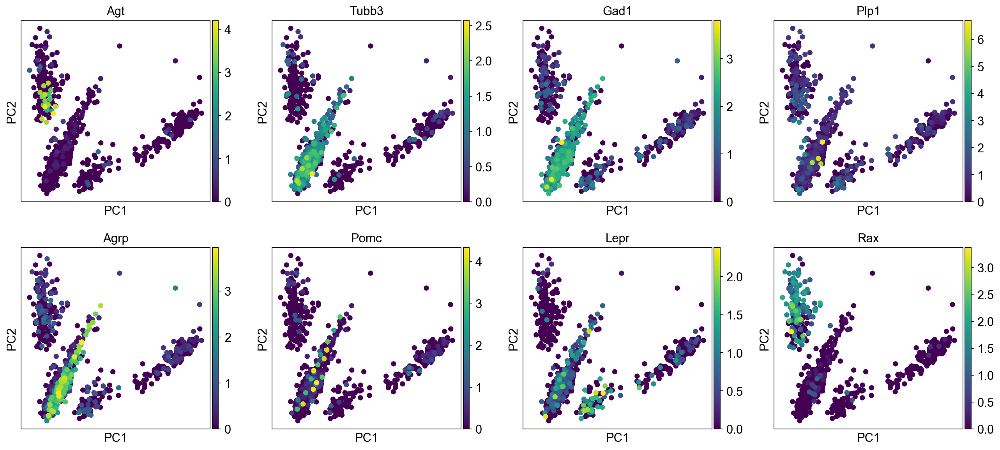

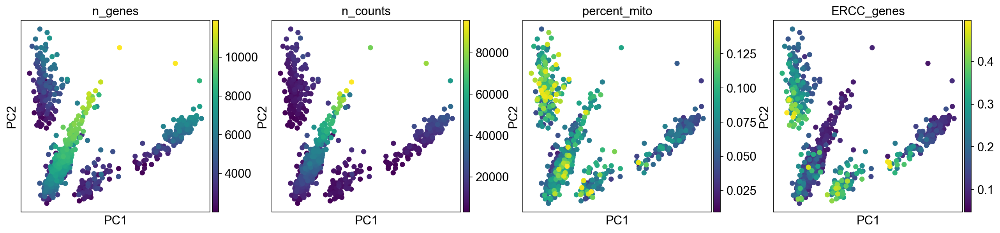

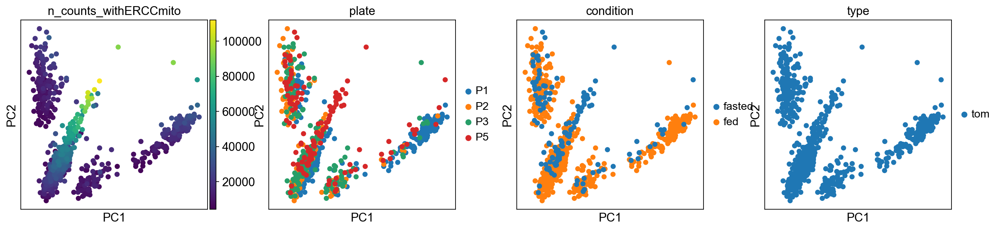

In [49]:
sc.pl.pca(adata_tomcells, color=['Agt','Tubb3','Gad1','Plp1','Agrp','Pomc','Lepr','Rax']
          ,save="_adata_tomcells_pca_1.pdf")
sc.pl.pca(adata_tomcells, color=['n_genes', 'n_counts', 'percent_mito','ERCC_genes'],save="_adata_tomcells_pca_2.pdf")
sc.pl.pca(adata_tomcells, color=['n_counts_withERCCmito','plate','condition','type'],save="_adata_tomcells_pca_3.pdf")

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.leiden()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

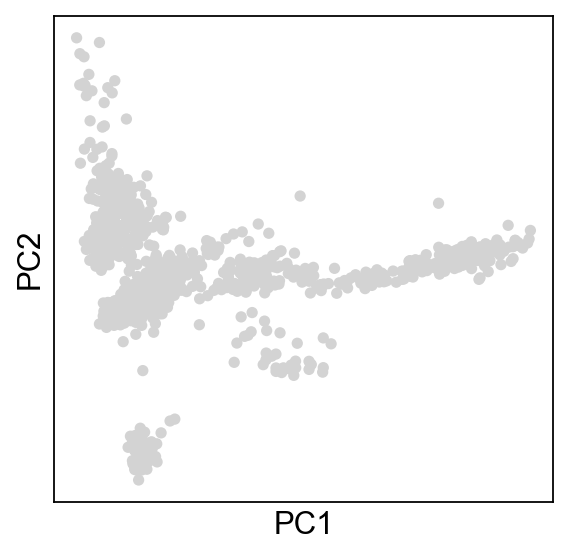

/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


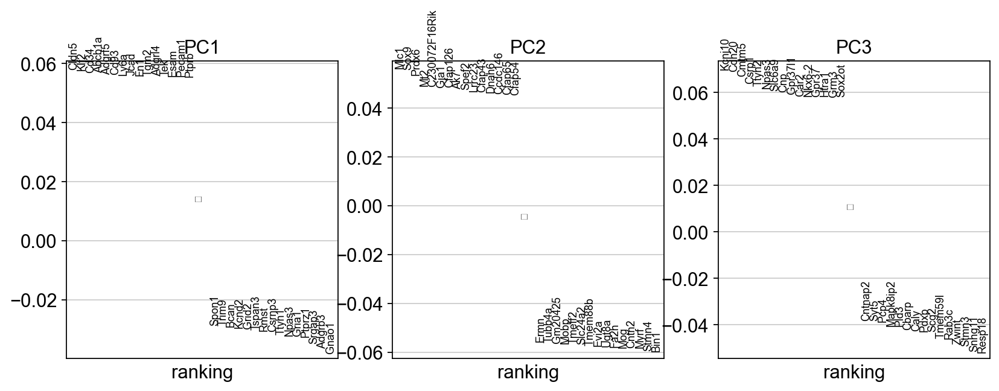

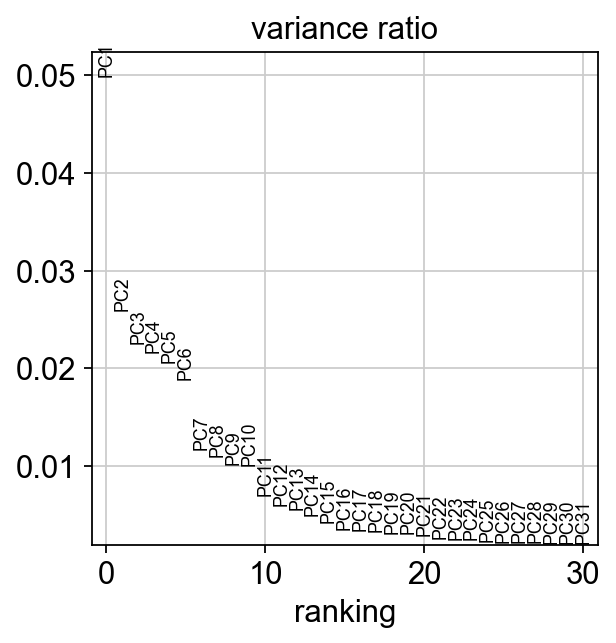

In [50]:
sc.pl.pca_overview(adata_allcells)

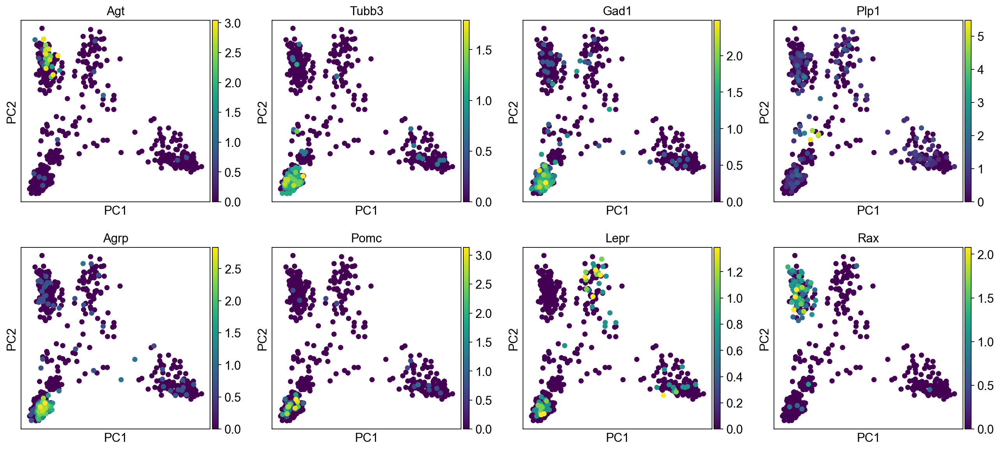

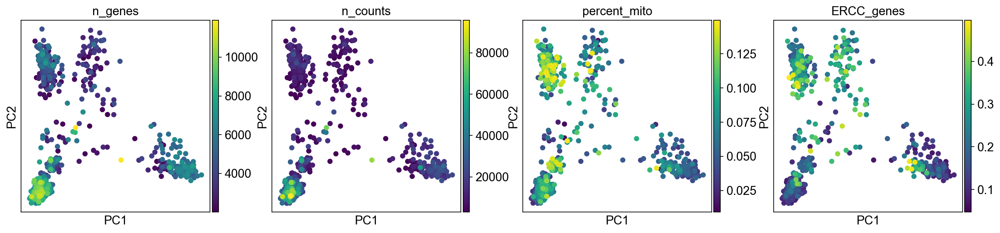

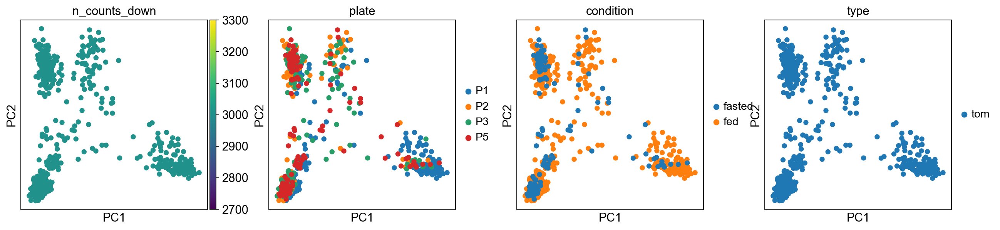

In [51]:
sc.pl.pca(adata_tomcells_down, color=['Agt','Tubb3','Gad1','Plp1','Agrp','Pomc','Lepr','Rax']
          ,save="_adata_tomcells_down_pca_1.pdf")
sc.pl.pca(adata_tomcells_down, color=['n_genes', 'n_counts', 'percent_mito','ERCC_genes'],save="_adata_tomcells_down_pca_2.pdf")
sc.pl.pca(adata_tomcells_down, color=['n_counts_down','plate','condition','type'],
          save="_adata_tomcells_down_pca_3.pdf")

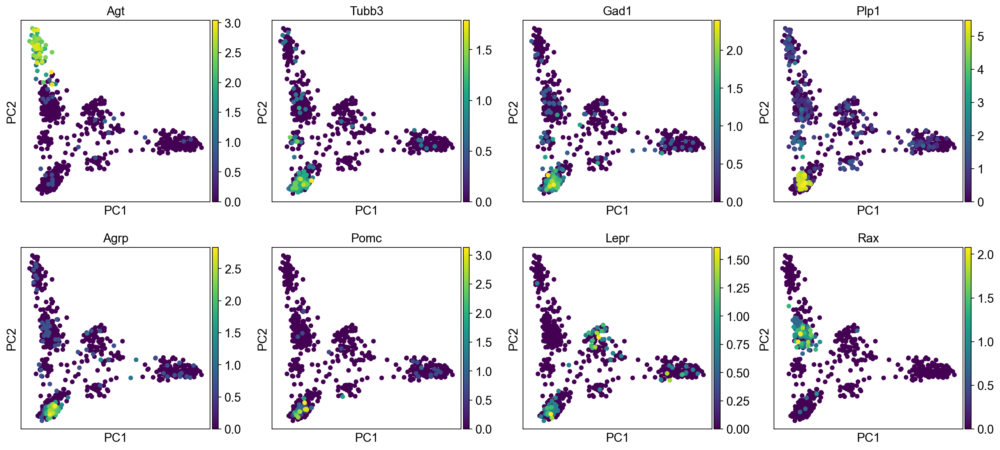

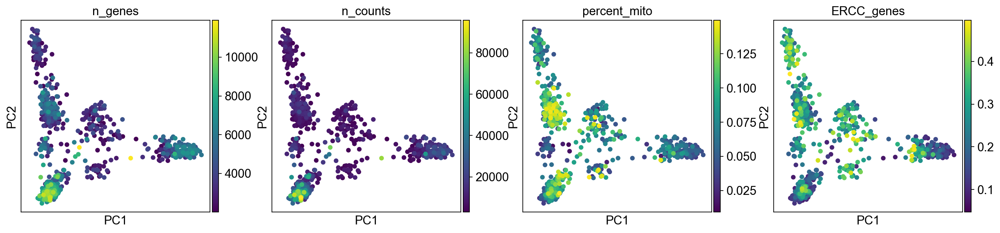

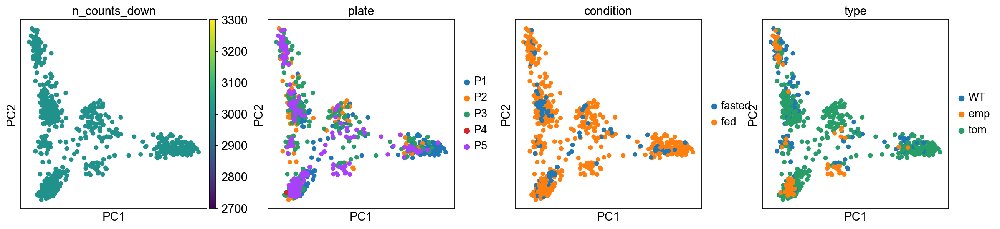

In [55]:
sc.pl.pca(adata_allcells_down, color=['Agt','Tubb3','Gad1','Plp1','Agrp','Pomc','Lepr','Rax']
          ,save="_adata_allcells_down_pca_1.pdf")
sc.pl.pca(adata_allcells_down, color=['n_genes', 'n_counts', 'percent_mito','ERCC_genes'],save="_adata_allcells_down_pca_2.pdf")
sc.pl.pca(adata_allcells_down, color=['n_counts_down','plate','condition','type'],
          save="_adata_allcells_down_pca_3.pdf")

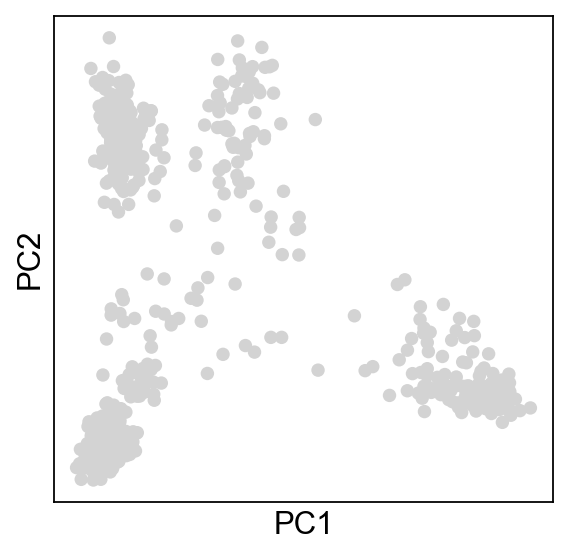

/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/onurbasak/miniconda3/envs/scenic_protocol/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


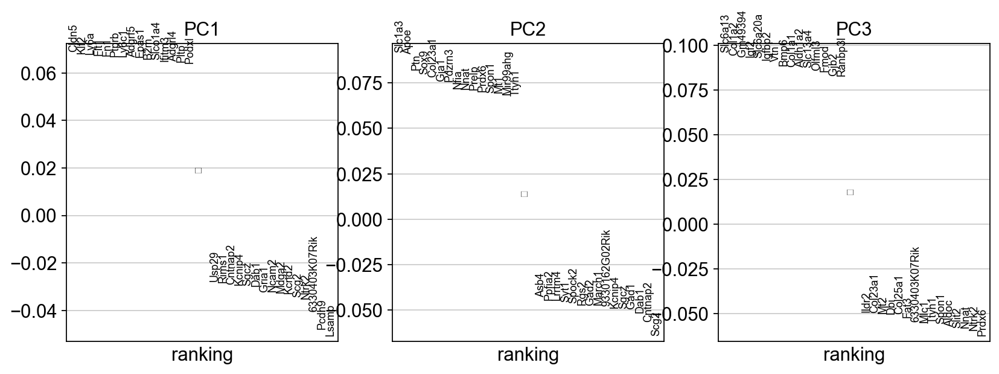

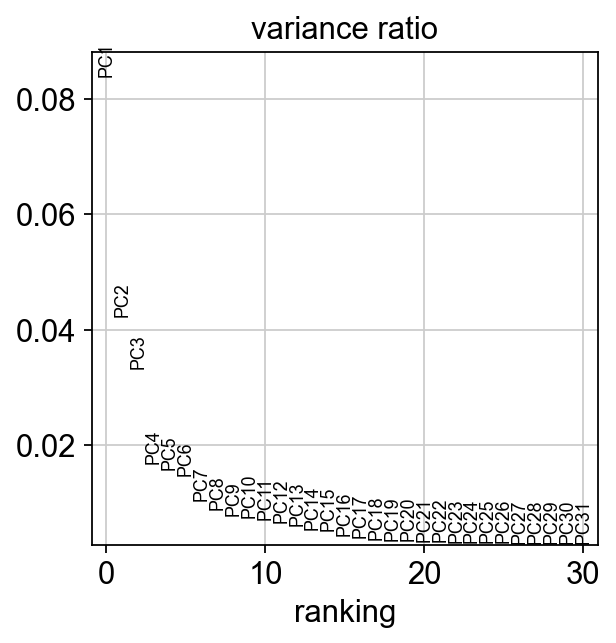

In [52]:
sc.pl.pca_overview(adata_tomcells_down)

In [53]:
#sc.pl.pca_loadings(adata_allcells,components = '1,2,3,4,5,6')

Save the result.

<div class="alert alert-block alert-success">

Save the datasets for later use. Continute with 'Kakava_scLepr_analysis.ipynb'
</div>    

In [54]:
adata_allcells.write('../rawdata/Lepr_hypothalamus_allcells_preprocess.h5ad', compression='gzip')
adata_tomcells.write('../rawdata/Lepr_hypothalamus_tomcells_preprocess.h5ad', compression='gzip')
adata_allcells_down.write('../rawdata/Lepr_hypothalamus_allcells_down_preprocess.h5ad', compression='gzip')
adata_tomcells_down.write('../rawdata/Lepr_hypothalamus_tomcells_down_preprocess.h5ad', compression='gzip')